### Yolov5 object detection model

First lets get the bounding boxes for the LIDC images

Install utils to process dicom images, process the LIDC dataset, process the images and save them to files, and to download files from GCP stores

### Imports

In [1]:
!pip install -r requirements.txt

     |████████████████████████████████| 2.0 MB 8.1 MB/s eta 0:00:01
     |████████████████████████████████| 5.6 MB 42.9 MB/s eta 0:00:01
     |████████████████████████████████| 3.3 MB 61.6 MB/s eta 0:00:01
     |████████████████████████████████| 2.9 MB 61.6 MB/s eta 0:00:01
     |████████████████████████████████| 203 kB 75.0 MB/s eta 0:00:01
     |████████████████████████████████| 30.2 MB 53.4 MB/s eta 0:00:01
     |████████████████████████████████| 1.6 MB 63.6 MB/s eta 0:00:01
     |████████████████████████████████| 3.1 MB 64.0 MB/s eta 0:00:01
     |████████████████████████████████| 89 kB 14.4 MB/s eta 0:00:01
     |████████████████████████████████| 135 kB 74.5 MB/s eta 0:00:01
     |████████████████████████████████| 96 kB 10.3 MB/s eta 0:00:01
     |████████████████████████████████| 45 kB 6.3 MB/s  eta 0:00:01
     |████████████████████████████████| 75 kB 7.0 MB/s  eta 0:00:01
     |████████████████████████████████| 95 kB 7.7 MB/s  eta 0:00:01
     |████████████████████████████████|

In [1]:
!pip install pydicom
!pip install pylidc
!pip install torchsummary
!pip install imageio
!pip install gsutil

     |████████████████████████████████| 2.0 MB 7.6 MB/s eta 0:00:01
     |████████████████████████████████| 5.6 MB 7.9 MB/s eta 0:00:01
     |████████████████████████████████| 1.6 MB 58.1 MB/s eta 0:00:01
     |████████████████████████████████| 30.2 MB 51.3 MB/s eta 0:00:01
     |████████████████████████████████| 3.3 MB 56.3 MB/s eta 0:00:01
     |████████████████████████████████| 178 kB 82.6 MB/s eta 0:00:01
     |████████████████████████████████| 6.3 MB 64.6 MB/s eta 0:00:01
     |████████████████████████████████| 3.1 MB 68.2 MB/s eta 0:00:01
     |████████████████████████████████| 156 kB 75.4 MB/s eta 0:00:01
  Attempting uninstall: pillow
    Found existing installation: Pillow 8.2.0
    Uninstalling Pillow-8.2.0:
      Successfully uninstalled Pillow-8.2.0
     |████████████████████████████████| 2.9 MB 7.2 MB/s eta 0:00:01
     |████████████████████████████████| 89 kB 13.4 MB/s eta 0:00:01
     |████████████████████████████████| 135 kB 97.8 MB/s eta 0:00:01
     |█████████████████

Install the util to sort the DICOM images

In [1]:
!git clone https://github.com/pieper/dicomsort.git

fatal: destination path 'dicomsort' already exists and is not an empty directory.


#### Set up connection to GCP, Gcloud, Big table 

Install utils to query the Bigtables

In [1]:
!pip install google-cloud-bigquery
!pip install --upgrade google-auth-oauthlib
!pip install --upgrade 'google-cloud-bigquery[bqstorage,pandas]'

     |████████████████████████████████| 203 kB 8.0 MB/s eta 0:00:01
     |████████████████████████████████| 45 kB 6.0 MB/s  eta 0:00:01
     |████████████████████████████████| 75 kB 7.0 MB/s  eta 0:00:01
     |████████████████████████████████| 95 kB 8.5 MB/s  eta 0:00:01
     |████████████████████████████████| 198 kB 92.0 MB/s eta 0:00:01
     |████████████████████████████████| 3.9 MB 85.9 MB/s eta 0:00:01
     |████████████████████████████████| 1.1 MB 56.9 MB/s eta 0:00:01
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.17.3
    Uninstalling protobuf-3.17.3:
      Successfully uninstalled protobuf-3.17.3
  Attempting uninstall: grpcio
    Found existing installation: grpcio 1.39.0
    Uninstalling grpcio-1.39.0:
      Successfully uninstalled grpcio-1.39.0
     |████████████████████████████████| 25.6 MB 7.3 MB/s eta 0:00:01
     |████████████████████████████████| 171 kB 80.6 MB/s eta 0:00:01
     |████████████████████████████████| 11.5 MB 60.1 MB/s eta 0:0

In [2]:
!pip list | grep google-cloud-bigquery

google-cloud-bigquery         2.30.1
google-cloud-bigquery-storage 2.10.0


Load the magic to query bigtables from notebook

Might need one restart after the previous step for the magic extension to load correctly

In [1]:
%load_ext google.cloud.bigquery

In [2]:
import pylidc as pl
from pylidc.utils import consensus
import pydicom as dicom
from skimage.measure import find_contours
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

Check if the util to process LIDC dataset is working properly

In [2]:
pl.query(pl.Scan).count()
pid = 'LIDC-IDRI-0069'#'LIDC-IDRI-0001'
scan = pl.query(pl.Scan).filter(pl.Scan.patient_id == pid).first()
scan.study_instance_uid

'1.3.6.1.4.1.14519.5.2.1.6279.6001.303241414168367763244410429787'

In [4]:
from google_auth_oauthlib import flow

# TODO: Uncomment the line below to set the `launch_browser` variable.
launch_browser = False
#
# The `launch_browser` boolean variable indicates if a local server is used
# as the callback URL in the auth flow. A value of `True` is recommended,
# but a local server does not work if accessing the application remotely,
# such as over SSH or from a remote Jupyter notebook.

appflow = flow.InstalledAppFlow.from_client_secrets_file(
    "client_secret_desktop.json", scopes=["https://www.googleapis.com/auth/bigquery"]
)

if launch_browser:
    appflow.run_local_server()
else:
    appflow.run_console()

credentials = appflow.credentials

Please visit this URL to authorize this application: https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=354066013909-il5lh54dbass54iv45m7thff0uuefjar.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fbigquery&state=G3qrBIFc2QRXGhCya82oJViqkDyArr&prompt=consent&access_type=offline


Enter the authorization code:  4/1AX4XfWhOQIA3pV__wvQ9dj2TNFlpusK8OfhNow7S3MQl8evWIY1Ek1f8_m4


In [5]:
from google.cloud.bigquery import magics
magics.context.credentials = credentials

#### Fetch the patient data from LIDC-IDRI dataset

In [6]:
#myProjectID = "positive-sector-330514"
myProjectID = "idc-external-012"

In [7]:
%%bigquery CT_series --project=$myProjectID 

WITH
  all_lidc_ct_series AS (
  SELECT
    DISTINCT(SeriesInstanceUID),
    StudyInstanceUID,  
    PatientID,
    SliceThickness,
    ARRAY_TO_STRING(PixelSpacing,"/") as pixelspa 
  FROM
    `canceridc-data.idc_views.dicom_all`
  WHERE
    Modality = "CT"
    AND collection_id = "lidc_idri")
SELECT PatientID,SliceThickness,pixelspa,StudyInstanceUID,SeriesInstanceUID FROM
  all_lidc_ct_series
ORDER BY
  PatientID

Downloading: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 1018/1018 [00:01<00:00, 633.06rows/s]


In [8]:
total_patients = len(np.unique(CT_series['PatientID']))
chosen_patients = len(np.unique(CT_series[(CT_series["SliceThickness"].astype(float)>=1.0)]['PatientID']))
print("Choosing patients with slice thickness > 1.0")
print("Total patients is {} and chosen patients are {}".format(total_patients, chosen_patients))

Choosing patients with slice thickness > 1.0
Total patients is 1010 and chosen patients are 971


In [9]:
import pandas as pd
ct_series_HR = CT_series[(CT_series["SliceThickness"].astype(float)>=1.0)]
print("Shape of the raw dataset is {}".format(ct_series_HR.shape))

Shape of the raw dataset is (979, 5)


In [10]:
to_download = []
base_gs_uri = 'gs://idc-tcia-lidc-idri/dicom/'

for i in range(ct_series_HR.shape[0]):
    to_download.append(base_gs_uri + ct_series_HR.iloc[i]['StudyInstanceUID'] + '/' + ct_series_HR.iloc[i]['SeriesInstanceUID'])

manifest_df = pd.DataFrame({"gcs":to_download},columns=["gcs"])

In [11]:
manifest_df.to_csv("gcs_paths_all.txt",header=False, index=False)
!head gcs_paths_all.txt

gs://idc-tcia-lidc-idri/dicom/1.3.6.1.4.1.14519.5.2.1.6279.6001.298806137288633453246975630178/1.3.6.1.4.1.14519.5.2.1.6279.6001.179049373636438705059720603192
gs://idc-tcia-lidc-idri/dicom/1.3.6.1.4.1.14519.5.2.1.6279.6001.490157381160200744295382098329/1.3.6.1.4.1.14519.5.2.1.6279.6001.619372068417051974713149104919
gs://idc-tcia-lidc-idri/dicom/1.3.6.1.4.1.14519.5.2.1.6279.6001.101370605276577556143013894866/1.3.6.1.4.1.14519.5.2.1.6279.6001.170706757615202213033480003264
gs://idc-tcia-lidc-idri/dicom/1.3.6.1.4.1.14519.5.2.1.6279.6001.191425307197546732281885591780/1.3.6.1.4.1.14519.5.2.1.6279.6001.323541312620128092852212458228
gs://idc-tcia-lidc-idri/dicom/1.3.6.1.4.1.14519.5.2.1.6279.6001.190188259083742759886805142125/1.3.6.1.4.1.14519.5.2.1.6279.6001.129007566048223160327836686225
gs://idc-tcia-lidc-idri/dicom/1.3.6.1.4.1.14519.5.2.1.6279.6001.324680252006411183918098592500/1.3.6.1.4.1.14519.5.2.1.6279.6001.132817748896065918417924920957
gs://idc-tcia-lidc-idri/dicom/1.3.6.1.4.

### Prepare data for the segmentation model (Unet) (OLD)

Save the images from DICOM as compressed numpy files

In [12]:
from tqdm import tqdm

In [4]:
from PIL import Image
import contextlib

def save_patient_images_and_masks(patient_id, root_dir='/app/data/yolov5'):
    scan = pl.query(pl.Scan).filter(pl.Scan.patient_id.in_([patient_id]))[0]
    nodules_annotation = scan.cluster_annotations()
    with contextlib.redirect_stdout(None):
        vol = scan.to_volume()

    cmask_CT = []
    cbbox_CT = []
    masks_CT = []
    for nodule_idx, nodule in enumerate(nodules_annotation):
        cmask, cbbox, masks = consensus(nodule)
        cmask_CT.append(cmask)
        cbbox_CT.append(cbbox)
        masks_CT.append(masks)   

    CT_mask = np.zeros_like(vol)    
    nodule_num = len(cmask_CT)

    for i in range(nodule_num):
        cmask = cmask_CT[i]
        cbbox = cbbox_CT[i]
        masks = masks_CT[i]    
        CT_mask[cbbox] += cmask

    for slice_id in range(vol.shape[2]):
        image = vol[:,:,slice_id]
        mask = CT_mask[:,:,slice_id]
        image_file_name = root_dir + "/images/" + "img" + "_" + str(patient_id) + "_" + str(slice_id) + ".npz"
        mask_file_name = root_dir + "/masks/" + "mask" + "_" + str(patient_id) + "_" + str(slice_id) + ".npz"
        np.savez_compressed(image_file_name, image)
        np.savez_compressed(mask_file_name, mask)

In [5]:
root_dir = '/app/data/yolov5'
def patient_data_as_npz_files():
    #get patient list
    patient_list = os.listdir(data_folder)
    if not os.path.exists(root_dir):
        print("Creating directory {}".format(root_dir))
        os.makedirs(root_dir)
    if not os.path.exists(root_dir + "/images/"):
        print("Creating directory {}".format(root_dir + "/images/"))
        os.makedirs(root_dir + "/images/")
    if not os.path.exists(root_dir + "/masks/"):
        print("Creating directory {}".format(root_dir + "/masks/"))
        os.makedirs(root_dir + "/masks/")
    print("Saving patient .npz files to {}".format(root_dir))
    for i in tqdm(range(len(patient_list))):
        try:
            save_patient_images_and_masks(patient_list[i], root_dir)
        except:
            print("Error getting DICOM files for patient {}, skipping".format(patient_list[i]))

### Download the DICOM images

- Define the paths where we will download the DICOM images from GCP and then sort them.
- Identify the patients (manifest) for the train, validation and test splits

In [13]:
yolo_data_dir = '/data/yolov5/'

In [14]:
idxs = np.arange(manifest_df.shape[0])
np.random.seed(2011)
np.random.shuffle(idxs)
split_ratio = 0.05
data_idxs = idxs[int(manifest_df.shape[0]*split_ratio):]
test_idxs = idxs[:int(manifest_df.shape[0]*split_ratio)]
split_ratio_val = 0.2
train_idxs = data_idxs[int(data_idxs.shape[0]*split_ratio_val):]
val_idxs = data_idxs[:int(data_idxs.shape[0]*split_ratio_val)]

In [15]:
print("Splits train:{}, val: {}, test: {}".format(train_idxs.shape[0],val_idxs.shape[0],test_idxs.shape[0]))

Splits train:745, val: 186, test: 48


#### Routine to download and sort the DICOM images

Adjust how many we want to download, for now I will download 50 patients

In [7]:
import os, shutil
import glob

def download_data(idxs, data_dir, dtype='train', paging=True):
    
    download_dir = data_dir + "/" + dtype + "/" + 'gcsfiles/'
    sorted_dir = data_dir + "/" + dtype + "/" + 'sorted_gcsfiles/'
    if not os.path.exists(download_dir):
        print("Creating directory {}".format(download_dir))
        os.makedirs(download_dir)
    else:
        print("Directory {} exists".format(download_dir))

    if not os.path.exists(sorted_dir):
        print("Creating directory {}".format(sorted_dir))
        os.makedirs(sorted_dir)
    else:
        print("Directory {} exists".format(sorted_dir))
    
    manifest = manifest_df.iloc[idxs]
    
    if paging:
        for i in tqdm(range(manifest.shape[0])):
            url = manifest.iloc[i].gcs

            #download the DICOM images
            download_command = "gsutil -u {} -m cp -r {} {} >/dev/null 2>&1".format(myProjectID, url, download_dir)
            os.system(download_command)

            if (i > 1) and (i % 50 == 0): # process 50 patients at a time, to save space on disk
                # sort the images
                sort_command = "python dicomsort/dicomsort.py -u {} {}/%PatientID/%StudyInstanceUID/%SeriesInstanceUID/%SOPInstanceUID.dcm".format(download_dir, sorted_dir)
                os.system(sort_command)

                # clean up the download dir
                files = glob.glob(download_dir + "/*")
                for j in tqdm(range(len(files))):
                    if os.path.isdir(files[j]):
                        shutil.rmtree(files[j])
    else:
        #download all
        for i in tqdm(range(manifest.shape[0])):
            url = manifest.iloc[i].gcs
            #download the DICOM images
            download_command = "gsutil -u {} -m cp -r {} {} >/dev/null 2>&1".format(myProjectID, url, download_dir)
            os.system(download_command)
            
        #sort all
        sort_command = "python dicomsort/dicomsort.py -u {} {}/%PatientID/%StudyInstanceUID/%SeriesInstanceUID/%SOPInstanceUID.dcm".format(download_dir, sorted_dir)
        os.system(sort_command)
        
        #clean up the download dir
        files = glob.glob(download_dir + "/*")
        for j in tqdm(range(len(files))):
            if os.path.isdir(files[j]):
                shutil.rmtree(files[j])

In [64]:
download_data(train_idxs, yolo_data_dir, 'train', True)

Directory /data/yolov5//train/gcsfiles/ exists
Directory /data/yolov5//train/sorted_gcsfiles/ exists


100%|██████████| 10557/10557 [00:19<00:00, 531.82it/s]                                                                        | 50/745 [03:13<40:14,  3.47s/it]


Files sorted



100%|██████████| 10638/10638 [00:23<00:00, 449.71it/s]                                                                       | 100/745 [09:58<32:43,  3.04s/it]


Files sorted



100%|██████████| 9873/9873 [00:21<00:00, 453.61it/s]                                                                         | 150/745 [16:09<27:58,  2.82s/it]


Files sorted



100%|██████████| 11202/11202 [00:47<00:00, 233.54it/s]                                                                       | 200/745 [22:16<34:16,  3.77s/it]


Files sorted



100%|██████████| 12748/12748 [01:21<00:00, 157.38it/s]                                                                       | 250/745 [29:35<35:59,  4.36s/it]


Files sorted



100%|██████████| 12311/12311 [01:09<00:00, 176.22it/s]                                                                       | 300/745 [37:10<33:32,  4.52s/it]


Files sorted



100%|██████████| 11966/11966 [01:05<00:00, 184.06it/s]███████▍                                                               | 350/745 [44:21<27:55,  4.24s/it]


Files sorted



100%|██████████| 10807/10807 [00:36<00:00, 292.64it/s]███████████████▍                                                       | 400/745 [51:19<22:02,  3.83s/it]


Files sorted



100%|██████████| 11451/11451 [00:53<00:00, 214.73it/s]███████████████████████▍                                               | 450/745 [57:55<18:50,  3.83s/it]


Files sorted



100%|██████████| 11516/11516 [00:57<00:00, 199.24it/s]██████████████████████████████▏                                      | 500/745 [1:04:45<19:53,  4.87s/it]


Files sorted



100%|██████████| 12166/12166 [01:09<00:00, 174.18it/s]██████████████████████████████████████                               | 550/745 [1:11:54<12:22,  3.81s/it]


Files sorted



100%|██████████| 11517/11517 [00:57<00:00, 199.90it/s]██████████████████████████████████████████████                       | 600/745 [1:19:03<11:44,  4.86s/it]


Files sorted



100%|██████████| 12729/12729 [01:19<00:00, 160.19it/s]█████████████████████████████████████████████████████▉               | 650/745 [1:26:19<11:53,  7.51s/it]


Files sorted



100%|██████████| 10916/10916 [00:46<00:00, 234.89it/s]█████████████████████████████████████████████████████████████▊       | 700/745 [1:33:27<03:02,  4.05s/it]


Files sorted



100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 745/745 [1:40:18<00:00,  8.08s/it]


In [208]:
%%time
download_data(val_idxs, '/rawdata/yolov5/', 'val', True)

Directory /rawdata/yolov5//val/gcsfiles/ exists
Directory /rawdata/yolov5//val/sorted_gcsfiles/ exists


  7%|▋         | 1235/18726 [00:05<01:20, 217.65it/s]                                                                         | 50/186 [02:47<08:15,  3.64s/it]



Source file: /rawdata/yolov5//val/gcsfiles/1.3.6.1.4.1.14519.5.2.1.6279.6001.195913706607582347421429908613/1.3.6.1.4.1.14519.5.2.1.6279.6001.308071517533621576717327194173.dcm
Target file: /rawdata/yolov5//val/sorted_gcsfiles//LIDC-IDRI-0200/1.3.6.1.4.1.14519.5.2.1.6279.6001.185852472264155752604841654643/1.3.6.1.4.1.14519.5.2.1.6279.6001.195913706607582347421429908613/1.3.6.1.4.1.14519.5.2.1.6279.6001.308071517533621576717327194173.dcm

Target file already exists - pattern is probably not unique
Aborting to avoid data loss.



  0%|          | 0/11175 [00:00<?, ?it/s]████████████████████████████▌                                                       | 100/186 [05:52<03:55,  2.74s/it]



Source file: /rawdata/yolov5//val/gcsfiles/1.3.6.1.4.1.14519.5.2.1.6279.6001.109203031650348694844047454215/1.3.6.1.4.1.14519.5.2.1.6279.6001.188168498211216255257672302898.dcm
Target file: /rawdata/yolov5//val/sorted_gcsfiles//LIDC-IDRI-0812/1.3.6.1.4.1.14519.5.2.1.6279.6001.129889229961080005326707611943/1.3.6.1.4.1.14519.5.2.1.6279.6001.109203031650348694844047454215/1.3.6.1.4.1.14519.5.2.1.6279.6001.188168498211216255257672302898.dcm

Target file already exists - pattern is probably not unique
Aborting to avoid data loss.



  0%|          | 0/11200 [00:00<?, ?it/s]████████████████████████████████████████████████████████████▊                       | 150/186 [08:49<02:11,  3.66s/it]



Source file: /rawdata/yolov5//val/gcsfiles/1.3.6.1.4.1.14519.5.2.1.6279.6001.231834776365874788440767645596/1.3.6.1.4.1.14519.5.2.1.6279.6001.130386891960848485758687911746.dcm
Target file: /rawdata/yolov5//val/sorted_gcsfiles//LIDC-IDRI-0647/1.3.6.1.4.1.14519.5.2.1.6279.6001.971476961920773226447199844576/1.3.6.1.4.1.14519.5.2.1.6279.6001.231834776365874788440767645596/1.3.6.1.4.1.14519.5.2.1.6279.6001.130386891960848485758687911746.dcm

Target file already exists - pattern is probably not unique
Aborting to avoid data loss.



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 186/186 [11:05<00:00,  3.58s/it]

CPU times: user 563 ms, sys: 2.81 s, total: 3.38 s
Wall time: 11min 5s


In [67]:
download_data(test_idxs, yolo_data_dir, 'test', False)

Creating directory /data/yolov5//test/gcsfiles/
Creating directory /data/yolov5//test/sorted_gcsfiles/


100%|██████████| 10363/10363 [00:24<00:00, 416.80it/s]


Files sorted


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 55.67it/s]


Configure the pylidc file so that we can query the download LIDC dataset

In [3]:
from PIL import Image
import contextlib

In [4]:
def set_dicom_path(dicom_path):
    f = open ('/root/.pylidcrc','w')    #For Colab
    f.write('[dicom]'+'\n')
    f.write('path =' + dicom_path +'\n')
    f.write('warn = True')
    f.close()

In [5]:
def load_vol_for_patient(patient_id, dicom_path):
    set_dicom_path(dicom_path)
    #patient_id = [patient_id
    scan = pl.query(pl.Scan).filter(pl.Scan.patient_id.in_([patient_id]))[0]
    nodules_annotation = scan.cluster_annotations()
    with contextlib.redirect_stdout(None):
        vol = scan.to_volume()
    return vol, nodules_annotation

In [6]:
dicom_root_dir = '/rawdata/train/sorted_gcsfiles/'

In [7]:
pat_id = 'LIDC-IDRI-0033'#'LIDC-IDRI-0001'
vol, nodules_annotation = load_vol_for_patient(pat_id, dicom_root_dir)
print("There are {} nodules annotated for the patient {}".format(len(nodules_annotation), pat_id))

There are 2 nodules annotated for the patient LIDC-IDRI-0033


#### Routines for bounding box extraction

Define some routines to get the bounding around for the masks for the image

In [6]:
import matplotlib.patches as patches
def get_bounding_box(img):
    minx = []
    miny = []
    maxx = []
    maxy = []
    contours = find_contours(img.astype(float), 0.5)
    for contour in contours:
        minx.append(np.min(contour[:,1]))
        maxx.append(np.max(contour[:,1]))
        miny.append(np.min(contour[:,0]))
        maxy.append(np.max(contour[:,0]))
        
    if len(minx) > 0:
        return [(a, b, w-a, h-b) for a, b, w, h in zip(minx, miny, maxx, maxy)]
    else:
        return None
    
def plot_bounding_box(img):
    fig, ax = plt.subplots()
    ax.imshow(img, cmap=plt.cm.gray)
    
    boxes = get_bounding_box(img)
    if boxes:
        for box in boxes:
            x,y,w,h = box
            print("x = {}, y = {}, w = {}, h= {}".format(x,y,w,h))
            rect = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

Routine to find all bounding boxes for the mask and plotting

In [4]:
def find_all_bboxes(nodule_annotation, nodule_id, plot=False):
    bboxes = []
    #cmask, cbbox, masks = consensus(nodule_annotation)
    
    cmask_CT = []
    cbbox_CT = []
    masks_CT = []
    for nodule_idx, nodule in enumerate(nodules_annotation):
        cmask, cbbox, masks = consensus(nodule)
        cmask_CT.append(cmask)
        cbbox_CT.append(cbbox)
        masks_CT.append(masks)
    CT_mask = np.zeros_like(vol)    
    nodule_num = len(cmask_CT)
    print("Number of nodules for patient {} is {}".format(patient_id, nodule_num))
    
    for i in range(nodule_num):
        cmask = cmask_CT[i]
        cbbox = cbbox_CT[i]
        masks = masks_CT[i]
        CT_mask[cbbox] += cmask
        

    print("There are {} slices in the image".format(cbbox_CT[nodule_id][2].stop - cbbox_CT[nodule_id][2].start))
    for idx in np.arange(cbbox_CT[nodule_id][2].start, cbbox_CT[nodule_id][2].stop):
        boxes = get_bounding_box(CT_mask[:,:,idx])
        if plot:
            plot_bounding_box(CT_mask[:,:,idx])
        bboxes.append(boxes)
    return bboxes

Routine to plot the bounding box around the mask in the full size mask

In [10]:
def plot_bbox_on_full_size_mask(vol, nodules_annotation, nodule_id):
    cmask_CT = []
    cbbox_CT = []
    masks_CT = []
    for nodule_idx, nodule in enumerate(nodules_annotation):
        cmask, cbbox, masks = consensus(nodule)
        cmask_CT.append(cmask)
        cbbox_CT.append(cbbox)
        masks_CT.append(masks)
    CT_mask = np.zeros_like(vol)    
    nodule_num = len(cmask_CT)
    print("Number of nodules for patient is {}".format(nodule_num))
    
    for i in range(nodule_num):
        cmask = cmask_CT[i]
        cbbox = cbbox_CT[i]
        masks = masks_CT[i]
        CT_mask[cbbox] += cmask
        
    for slice_idx in np.arange(cbbox_CT[nodule_id][2].start, cbbox_CT[nodule_id][2].stop):
        plot_bounding_box(CT_mask[:,:,slice_idx])

Number of nodules for patient is 2
x = 379.5, y = 319.5, w = 8.0, h= 6.0
x = 267.5, y = 323.5, w = 16.0, h= 11.0
x = 267.5, y = 325.5, w = 18.0, h= 12.0
x = 276.5, y = 328.5, w = 11.0, h= 12.0
x = 279.5, y = 332.5, w = 8.0, h= 11.0
x = 281.5, y = 336.5, w = 7.0, h= 8.0
x = 281.5, y = 335.5, w = 6.0, h= 10.0


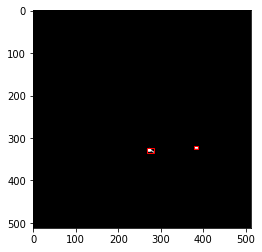

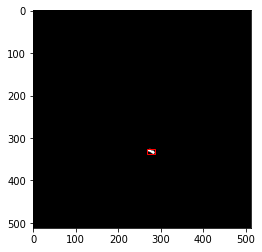

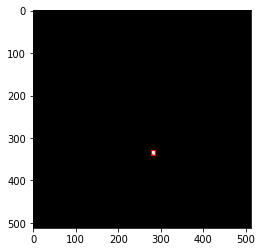

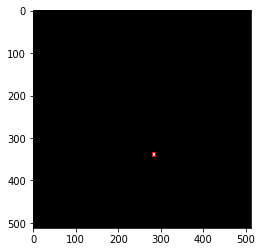

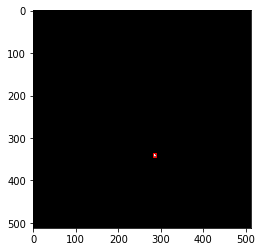

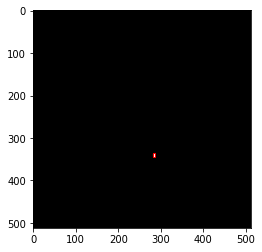

In [34]:
plot_bbox_on_full_size_mask(vol, nodules_annotation, 1)

Routine to plot the bounding box around the nodule using the mask bounding box coordinates

In [11]:
def plot_bbox_on_image(vol, nodules_annotation, nodule_id):
    cmask_CT = []
    cbbox_CT = []
    masks_CT = []
    for nodule_idx, nodule in enumerate(nodules_annotation):
        cmask, cbbox, masks = consensus(nodule)
        cmask_CT.append(cmask)
        cbbox_CT.append(cbbox)
        masks_CT.append(masks)
    CT_mask = np.zeros_like(vol)    
    nodule_num = len(cmask_CT)
    print("Number of nodules for patient is {}".format(nodule_num))
    
    for i in range(nodule_num):
        cmask = cmask_CT[i]
        cbbox = cbbox_CT[i]
        masks = masks_CT[i]
        CT_mask[cbbox] += cmask
        
    for slice_idx in np.arange(cbbox_CT[nodule_id][2].start, cbbox_CT[nodule_id][2].stop):
        boxes = get_bounding_box(CT_mask[:,:,slice_idx])
        img = vol[:,:,slice_idx]
        fig, ax = plt.subplots()
        ax.imshow(img, cmap=plt.cm.gray)
        if boxes:
            for box in boxes:
                x, y, w, h = box
                print("x = {}, y = {}, w = {}, h= {}".format(x,y,w,h))
                rect = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
                ax.add_patch(rect)

Number of nodules for patient is 2
x = 377.5, y = 316.5, w = 11.0, h= 9.0
x = 377.5, y = 316.5, w = 10.0, h= 10.0
x = 379.5, y = 319.5, w = 8.0, h= 6.0
x = 267.5, y = 323.5, w = 16.0, h= 11.0


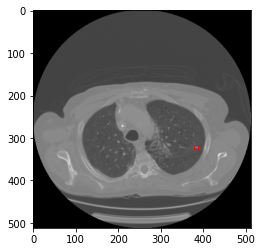

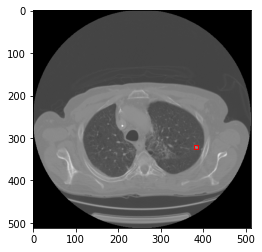

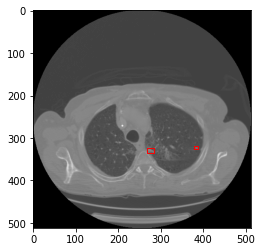

In [36]:
plot_bbox_on_image(vol, nodules_annotation, 0)

### Prepare the dataset for YoloV5 training

Routine to create the image and the labels (based on bounding boxes) for Yolov5 training

#### Clear the contents of the generated images and labels for Yolov5

In [5]:
import shutil
def clear_dirs(paths):
    for path in paths:
        if os.path.isdir(path):
            shutil.rmtree(path)

##### For all the patients we downloaded, extract the bounding box and create the image and labels for YoloV5 training

### Save image label and mask

For each CT image, save the image, the mask and the bounding box label

For bounding box dataset, save empty files for images with no mask.

### DEBUG: what if there are more than one mask, how does the bounding box detector work?

patient id: 'LIDC-IDRI-0033', slice 107 has 2 contours

In [30]:
patient_id = 'LIDC-IDRI-0033'
scan = pl.query(pl.Scan).filter(pl.Scan.patient_id.in_([patient_id]))[0]
nodules_annotation = scan.cluster_annotations()
with contextlib.redirect_stdout(None):
    vol = scan.to_volume()
vol.shape

/opt/conda/lib/python3.8/site-packages/pylidc/Scan.py:67: UserWarning: Could not find `dicom` configuration section or  `path` configuration option under that section.A template config file will be written to /root/.pylidcrc.
  warnings.warn(msg.format(conf_file))


RuntimeError: Could not establish path to dicom files. Have you specified the `path` option in the configuration file /root/.pylidcrc?

In [49]:
# save all the masks
cmask_CT = []
cbbox_CT = []
masks_CT = []
for nodule_idx, nodule in enumerate(nodules_annotation):
    cmask, cbbox, masks = consensus(nodule)
    cmask_CT.append(cmask)
    cbbox_CT.append(cbbox)
    masks_CT.append(masks)
CT_mask = np.zeros_like(vol)    
nodule_num = len(cmask_CT)
print(nodule_num)

2


In [50]:
for i in range(nodule_num):
    cmask = cmask_CT[i]
    cbbox = cbbox_CT[i]
    masks = masks_CT[i]
    CT_mask[cbbox] += cmask

In [51]:
CT_mask.shape

(512, 512, 137)

In [52]:
cbbox_CT[0]

(slice(315, 329, None), slice(375, 390, None), slice(105, 108, None))

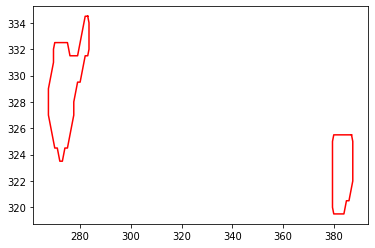

In [53]:
colors = ['r', 'g', 'b', 'y']
for c in find_contours(CT_mask[:,:,107].astype(float), 0.5):
    label = "Annotation %d" % (1)
    plt.plot(c[:,1], c[:,0], colors[0], label=label)

In [35]:
class RedirectStdStreams(object):
    def __init__(self, stdout=None, stderr=None):
        self._stdout = stdout or sys.stdout
        self._stderr = stderr or sys.stderr

    def __enter__(self):
        self.old_stdout, self.old_stderr = sys.stdout, sys.stderr
        self.old_stdout.flush(); self.old_stderr.flush()
        sys.stdout, sys.stderr = self._stdout, self._stderr

    def __exit__(self, exc_type, exc_value, traceback):
        self._stdout.flush(); self._stderr.flush()
        sys.stdout = self.old_stdout
        sys.stderr = self.old_stderr

In [37]:
def un(a, b):
    return np.union1d(a, b)

def unr(ll, acc, i):
    if i < len(ll):
        j = i + 1
        acc = un(ll[i], acc)
        return unr(ll, acc, j)
    else:
        return acc

def get_slices_with_masks(cbbox_CT):
    ll = []
    for cb in cbbox_CT:
        ll.append(np.arange(cb[2].start, cb[2].stop+1))
    return unr(ll, [], 0)

In [169]:
import os
import contextlib
import imageio
from __future__ import print_function
import sys
from contextlib import redirect_stdout, redirect_stderr

"""
Save images and labels for nodules that have annotations from all 4 radiologists
"""
def save_image_mask_label(patient_id, imagedirname, labeldirname, maskdirname, normalize=False):
    
    devnull = open(os.devnull, 'w')
    # save all the images for the patient
    # query the image data from the CT volume
    
    scan = pl.query(pl.Scan).filter(pl.Scan.patient_id.in_([patient_id]))[0]
    nodules_annotation = scan.cluster_annotations()
    try:
        with contextlib.redirect_stdout(None):
            vol = scan.to_volume()
    except:
        print("Error loading DICOM for patient {}".format(patient_id))
        return
    
    
    # process the mask for the image
    cmask_CT = []
    cbbox_CT = []
    masks_CT = []
    for nodule_idx, nodule in enumerate(nodules_annotation):
        if len(nodule) >=4:
            cmask, cbbox, masks = consensus(nodule)
            cmask_CT.append(cmask)
            cbbox_CT.append(cbbox)
            masks_CT.append(masks)
        
    if len(cbbox_CT) <=0:
        print("No relevant nodules for patient {}".format(patient_id))
        return
    
    
    CT_mask = np.zeros_like(vol)    
    nodule_num = len(cmask_CT)
      
    for i in range(nodule_num):
        cmask = cmask_CT[i]
        cbbox = cbbox_CT[i]
        masks = masks_CT[i]
        CT_mask[cbbox] += cmask
    
    # get the slices that have annotations
    slices_with_mask = get_slices_with_masks(cbbox_CT)

    idxs = np.arange(CT_mask.shape[2])
    # get all slices that have no annotations
    compl_idxs = [idx for idx in idxs if idx not in slices_with_mask]
    SEED = 2021
    np.random.seed(SEED)
    # random sample the slices with no annotations
    np.random.shuffle(compl_idxs)
    # select equal number of non annotated slices as the number of annotated slices
    compl_idxs = compl_idxs[:len(slices_with_mask)]
    all_slices = np.union1d(slices_with_mask, compl_idxs)
    #save the images and masks and labels for only slices_with_mask and compl_idxs
    all_slices = all_slices.astype(int)

    #save images
    
    # iterate through all slices and save the images
    z_slice_cnt = 0
    #for z_slice in range(vol.shape[2]):
    for z_slice in all_slices:
        im = vol[:,:,z_slice]
        #mean normalize the image to prevent unit8 conversion errors when saving with imageio
        if normalize:
            im = im - np.mean(im)
            im = im / np.std(im)
        image_filename = "{}_{}.jpg".format(patient_id, z_slice)
        with RedirectStdStreams(stdout=devnull, stderr=devnull):
            imageio.imwrite(imagedirname + "/" + image_filename, im)
        z_slice_cnt += 1
    
  
    ## NOTE: do not save the mask for Yolo training, it messed with the training
    # save all the masks
    img_count = 0
    for k_slice in all_slices:
        msk = CT_mask[:,:,k_slice]
        mask_filename = "{}_{}.jpg".format(patient_id, k_slice)

        if not os.path.exists(maskdirname):
            os.makedirs(maskdirname)
        with RedirectStdStreams(stdout=devnull, stderr=devnull):
            imageio.imwrite(maskdirname + "/" + mask_filename, msk)
        img_count += 1
    
    
    # save bounding box labels
    #for k_slice in range(CT_mask.shape[2]):
    for k_slice in all_slices:
        msk = CT_mask[:,:,k_slice]
        boxes = get_bounding_box(msk)
        if boxes:
            for box in boxes:
                x, y, w, h = box
                center_x = (x + ((w)/2))/vol[:,:,k_slice].shape[0]
                center_y = (y + ((h)/2))/vol[:,:,k_slice].shape[1]
                width = w/vol[:,:,k_slice].shape[0]
                height = h/vol[:,:,k_slice].shape[1]

                c = 0 # there is only one class, the 'nodule'
                # save this as the label for the image for the YoloV5 object detection training
                #print("Yolov5 formatted labels are = {} {} {} {} {}".format(c, center_x, center_y, width, height))
                label = "{} {} {} {} {}".format(c, center_x, center_y, width, height)
                label_filename = "{}_{}.txt".format(patient_id, k_slice)

                f = open(labeldirname + "/" + label_filename, "a")
                f.write(label + "\n")
                f.close()
        else:
            c = 0 # there is only one class, the 'nodule'
            # save this as the label for the image for the YoloV5 object detection training
            #print("Saving empty file for patient {}".format(patient_id))
            label_filename = "{}_{}.txt".format(patient_id, k_slice)
            f = open(labeldirname + "/" + label_filename, "a")
            f.write("")
            f.close()

In [140]:
import os
import contextlib
import imageio
from __future__ import print_function
import sys
from contextlib import redirect_stdout, redirect_stderr

"""
Save images and labels for nodules that have annotations from all 4 radiologists
"""
def save_image_mask_label_2(patient_id, imagedirname, labeldirname, maskdirname):
    
    devnull = open(os.devnull, 'w')
    # save all the images for the patient
    # query the image data from the CT volume
    
    scan = pl.query(pl.Scan).filter(pl.Scan.patient_id.in_([patient_id]))[0]
    nodules_annotation = scan.cluster_annotations()
    try:
        with contextlib.redirect_stdout(None):
            vol = scan.to_volume()
    except:
        print("Error loading DICOM for patient {}".format(patient_id))
        return
    
    
    # process the mask for the image
    cmask_CT = []
    cbbox_CT = []
    masks_CT = []
    for nodule_idx, nodule in enumerate(nodules_annotation):
        if len(nodule) >=4:
            cmask, cbbox, masks = consensus(nodule)
            cmask_CT.append(cmask)
            cbbox_CT.append(cbbox)
            masks_CT.append(masks)
        
    if len(cbbox_CT) <=0:
        print("No relevant nodules for patient {}".format(patient_id))
        return
    
    
    CT_mask = np.zeros_like(vol)    
    nodule_num = len(cmask_CT)
      
    for i in range(nodule_num):
        cmask = cmask_CT[i]
        cbbox = cbbox_CT[i]
        masks = masks_CT[i]
        CT_mask[cbbox] += cmask
    
    # get the slices that have annotations
    slices_with_mask = get_slices_with_masks(cbbox_CT)

    idxs = np.arange(CT_mask.shape[2])
    # get all slices that have no annotations
    compl_idxs = [idx for idx in idxs if idx not in slices_with_mask]
    SEED = 2021
    np.random.seed(SEED)
    # random sample the slices with no annotations
    np.random.shuffle(compl_idxs)
    # select equal number of non annotated slices as the number of annotated slices
    compl_idxs = compl_idxs[:len(slices_with_mask)]
    all_slices = np.union1d(slices_with_mask, compl_idxs)
    #save the images and masks and labels for only slices_with_mask and compl_idxs
    all_slices = all_slices.astype(int)

    #save images
    
    # iterate through all slices and save the images
    z_slice_cnt = 0
    #for z_slice in range(vol.shape[2]):
    for z_slice in all_slices:
        im = vol[:,:,z_slice]
        # mean normalize the image to prevent unit8 conversion errors when saving with imageio
#         im = im - np.mean(im)
#         im = im / np.std(im)
        image_filename = "{}_{}.jpg".format(patient_id, z_slice)
        with RedirectStdStreams(stdout=devnull, stderr=devnull):
            imageio.imwrite(imagedirname + "/" + image_filename, im)
        z_slice_cnt += 1
    
  
    ## NOTE: do not save the mask for Yolo training, it messed with the training
    # save all the masks
#     img_count = 0
#     for k_slice in all_slices:
#         msk = CT_mask[:,:,k_slice]
#         mask_filename = "{}_{}.jpg".format(patient_id, k_slice)

#         if not os.path.exists(maskdirname):
#             os.makedirs(maskdirname)
#         with RedirectStdStreams(stdout=devnull, stderr=devnull):
#             imageio.imwrite(maskdirname + "/" + mask_filename, msk)
#         img_count += 1
    
    
    # save bounding box labels
    #for k_slice in range(CT_mask.shape[2]):
    for k_slice in all_slices:
        msk = CT_mask[:,:,k_slice]
        boxes = get_bounding_box(msk)
        if boxes:
            for box in boxes:
                x, y, w, h = box
                center_x = (x + ((w)/2))/vol[:,:,k_slice].shape[0]
                center_y = (y + ((h)/2))/vol[:,:,k_slice].shape[1]
                width = w/vol[:,:,k_slice].shape[0]
                height = h/vol[:,:,k_slice].shape[1]

                c = 0 # there is only one class, the 'nodule'
                # save this as the label for the image for the YoloV5 object detection training
                #print("Yolov5 formatted labels are = {} {} {} {} {}".format(c, center_x, center_y, width, height))
                label = "{} {} {} {} {}".format(c, center_x, center_y, width, height)
                label_filename = "{}_{}.txt".format(patient_id, k_slice)

                f = open(labeldirname + "/" + label_filename, "a")
                f.write(label + "\n")
                f.close()
        else:
            c = 0 # there is only one class, the 'nodule'
            # save this as the label for the image for the YoloV5 object detection training
            #print("Saving empty file for patient {}".format(patient_id))
            label_filename = "{}_{}.txt".format(patient_id, k_slice)
            f = open(labeldirname + "/" + label_filename, "a")
            f.write("")
            f.close()

#### Routine to save cropped images and masks 

##### Check the distribution of the size of the annotations

In [10]:
patient_id = patient_list_test[5]

def get_boxes(patient_id):
    scan = pl.query(pl.Scan).filter(pl.Scan.patient_id.in_([patient_id]))[0]
    nodules_annotation = scan.cluster_annotations()
    try:
        vol = scan.to_volume()
    except:
        return []
    box_sizes = []

    # process the mask for the image
    cmask_CT = []
    cbbox_CT = []
    masks_CT = []
    for nodule_idx, nodule in enumerate(nodules_annotation):
        #if len(nodule) >= 4:
        cmask, cbbox, masks = consensus(nodule)
        cmask_CT.append(cmask)
        cbbox_CT.append(cbbox)
        masks_CT.append(masks)
        w = cbbox[0].stop - cbbox[0].start
        h = cbbox[1].stop - cbbox[1].start
        box = {'w':w,'h':h}
        box_sizes.append(box)
    return box_sizes

boxes = get_boxes(patient_id)

NameError: name 'patient_list_test' is not defined

In [9]:

def load_patient_vol_and_mask(dicom_dir, patient_id=-1):
    
    f = open ('/root/.pylidcrc','w')    #For Colab
    f.write('[dicom]'+'\n')
    f.write('path =' + dicom_dir +'\n')
    f.write('warn = True')
    f.close()

    patient_list = os.listdir(dicom_dir)
    if patient_id == -1: #select one randomly
        patient_id = np.random.choice(patient_list)
    scan = pl.query(pl.Scan).filter(pl.Scan.patient_id.in_([patient_id]))[0]
    nodules_annotation = scan.cluster_annotations()
    try:
        vol = scan.to_volume()
    except:
        print("Error loading DICOM for patient {}".format(patient_id))
        return None, None, None
    # are there nodules that are useful?

    # process the mask for the image
    cmask_CT = []
    cbbox_CT = []
    masks_CT = []
    for nodule_idx, nodule in enumerate(nodules_annotation):
        if len(nodule) >= 4:
            cmask, cbbox, masks = consensus(nodule)
            cmask_CT.append(cmask)
            cbbox_CT.append(cbbox)
            masks_CT.append(masks)

    if len(cbbox_CT) <=0:
        print("No relevant nodules for patient {}".format(patient_id))
        return None, None, None


    # create the mask voxel
    CT_mask = np.zeros_like(vol)    
    nodule_num = len(cmask_CT)

    #print("Number of nodules {}".format(nodule_num))
    for i in range(nodule_num):
        cmask = cmask_CT[i]
        cbbox = cbbox_CT[i]
        masks = masks_CT[i]
        CT_mask[cbbox] += cmask

    # get the slices that have annotations
    slices_with_mask = get_slices_with_masks(cbbox_CT)
    
    return vol, CT_mask, cbbox_CT, slices_with_mask

In [12]:
vol, CT_mask, cbbox, slices_with_mask = load_patient_vol_and_mask('/rawdata/train/sorted_gcsfiles', 'LIDC-IDRI-0284')
print("There are {} nodules".format(len(cbbox)))

Loading dicom files ... This may take a moment.
There are 2 nodules


In [13]:
def plot_side_by_side(vol, mask, idx):
    f, a = plt.subplots(1,2, figsize=(8,10))
    a[0].imshow(vol[:,:,idx])
    a[1].imshow(mask[:,:,idx])
    plt.show()

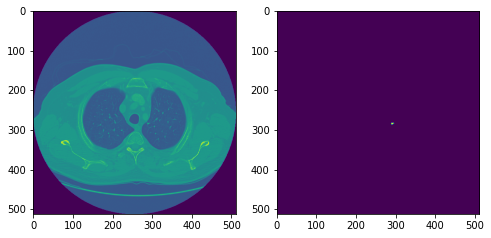

In [14]:
plot_side_by_side(vol, CT_mask, 110)

In [15]:
# get 8 pixels along all axes
def plot_side_by_side_cropped(cbbox, vol, mask, idx):
    f, a = plt.subplots(1,2, figsize=(8,10))
    a[0].imshow(vol[cbbox[0],cbbox[1],cbbox[2]][:,:,idx])
    a[1].imshow(mask[cbbox[0],cbbox[1],cbbox[2]][:,:,idx])
    plt.show()

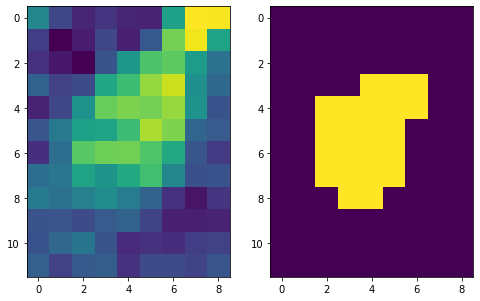

In [16]:
nodule_number = 0
plot_side_by_side_cropped(cbbox[nodule_number], vol, CT_mask, 0)

In [34]:
# take 32 pixels including c_x on each axis
def get_stride(c):
    start = 0
    if (c - 32) > 0:
        start = c - 32
    else:
        start = 0
    if (c + 32) < 512:
        stop = c + 32
    else:
        stop = 512
    return slice(start, stop, None)

"""
    Get a 64x64 image around the nodule, when using random = false, we get the actual clip of the annotated nodule,
    when using random = true, get a 64x64 image around the nodule randomly chosen which may or may not show a part of the nodule
"""
def get_nodule_part(cbbox, random=False):
    # extract 64x64 size images from the image randomly including the mask
    c_x = int(cbbox[0].start + (cbbox[0].stop - cbbox[0].start)/2)
    c_y = int(cbbox[1].start + (cbbox[1].stop - cbbox[1].start)/2)
    #print(c_x, c_y)
    if random: # random center within 64x64 box
        c_x = np.random.choice(np.arange(cbbox[0].start, cbbox[0].stop))
        c_y = np.random.choice(np.arange(cbbox[1].start, cbbox[1].stop))
    return get_stride(c_x), get_stride(c_y), cbbox[2]

"""
    Get a 64x64 image just outside the  
"""
def get_outside_part(cbbox, random=False):
    # extract 64x64 size images from the image randomly including the mask
    c_x = int(cbbox[0].start + (cbbox[0].stop - cbbox[0].start)/2)
    c_y = int(cbbox[1].start + (cbbox[1].stop - cbbox[1].start)/2)
    #print(c_x, c_y)
    if random: # random center within 64x64 box
        c_x = np.random.choice(np.arange(cbbox[0].start, cbbox[0].stop))
        c_y = np.random.choice(np.arange(cbbox[1].start, cbbox[1].stop))
    return get_stride(c_x), get_stride(c_y), cbbox[2]

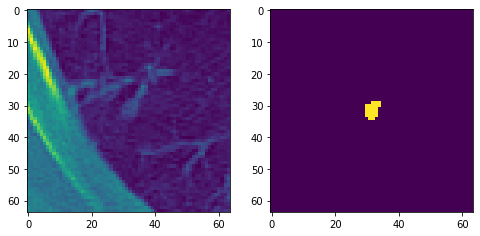

In [18]:
out_slice = get_nodule_part(cbbox[nodule_number])
out_masks = CT_mask[out_slice]
out_img = vol[out_slice]
f, a = plt.subplots(1,2, figsize=(8,10))
a[0].imshow(out_img[:,:,0])
a[1].imshow(out_masks[:,:,0])
plt.show()

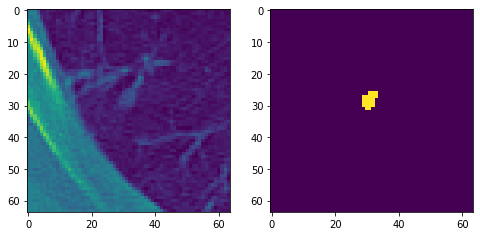

In [29]:
out_slice = get_nodule_part(cbbox[nodule_number], random=True)
out_masks = CT_mask[out_slice]
out_img = vol[out_slice]
f, a = plt.subplots(1,2, figsize=(8,10))
a[0].imshow(out_img[:,:,0])
a[1].imshow(out_masks[:,:,0])
plt.show()

In [33]:
def in_box(coord):
    return (coord[0] + 32 < 512) and (coord[0] - 32 > 0) and (coord[1] + 32 < 512) and (coord[1] - 32 > 0)

def get_slices(boxes, flipxy=True):
    slices = []
    for box in boxes:
        if flipxy:
            x = int(box[1])
            w = x + int(box[2])
            y = int(box[0])
            h = y + int(box[3])
            slices.append((slice(x, w, None), slice(y, h, None)))
        else:
            x = int(box[0])
            w = x + int(box[2])
            y = int(box[1])
            h = y + int(box[3])
            slices.append((slice(x, w, None), slice(y, h, None)))
    return slices


# get boxes outside of this slice, get a 64x64 box just outside these slices
def get_all_box_centers(slices, shift):
    coords = []
    for slc in slices:
        xslc = slc[0]
        yslc = slc[1]
        coords.extend([a for a in zip(np.repeat(xslc.start - shift, yslc.stop-yslc.start), np.arange(yslc.start, yslc.stop))])
        coords.extend([a for a in zip(np.repeat(xslc.stop + shift, yslc.stop-yslc.start), np.arange(yslc.start, yslc.stop))])
        coords.extend([a for a in zip(np.arange(xslc.start, xslc.stop), np.repeat(yslc.stop + shift, xslc.stop-xslc.start))])
        coords.extend([a for a in zip(np.arange(xslc.start, xslc.stop), np.repeat(yslc.start - shift, xslc.stop-xslc.start))])
        coords = [crd for crd in coords if in_box(crd)]
    return coords

def get_slice(coords):
    idx = np.random.choice(np.arange(len(coords)))
    x, y = coords[idx]
    return (slice(x-32,x+32, None), slice(y-32, y+32, None))

In [31]:
CT_mask[:,:,cbbox[nodule_number][2]].shape

(512, 512, 3)

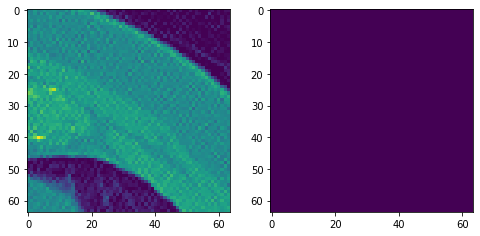

In [32]:
slice_id = 0
boxes = get_bounding_box(CT_mask[:,:,cbbox[nodule_number][2]][:,:,slice_id])
slices = get_slices(boxes, False)
coords = get_all_box_centers(slices, 34)
out_slices = get_slice(coords)
out_slices = out_slices + (cbbox[nodule_number][2],)
out_masks = CT_mask[out_slices]
out_img = vol[out_slices]
f, a = plt.subplots(1,2, figsize=(8,10))
a[0].imshow(out_img[:,:,0])
a[1].imshow(out_masks[:,:,0])
plt.show()

In [34]:
def save_surrounding_images(root_dir, patient_id, bounding_box, nodule_number, vol, CT_mask, random=False, image_save=False, image_plot=True):
    if image_save:
        assert os.path.exists(root_dir)
        image_dir = root_dir + '/images/'
        mask_dir = root_dir + '/masks/'
        assert os.path.exists(image_dir)
        assert os.path.exists(mask_dir)
    voxel = CT_mask[:,:,bounding_box[nodule_number][2]]
    for slice_id in range(voxel.shape[2]):
        boxes = get_bounding_box(voxel[:,:,slice_id])
        slices = get_slices(boxes, False)
        coords = get_all_box_centers(slices, 34)
        out_slices = get_slice(coords)
        out_slices = out_slices + (bounding_box[nodule_number][2],)
        out_masks = CT_mask[out_slices]
        out_img = vol[out_slices]
    for slice_id in range(out_masks.shape[2]):
        if image_save:
            image_file_name = "img_{}_{}_{}.jpg".format(patient_id, nodule_number, slice_index)
            mask_file_name = "mask_{}_{}_{}.jpg".format(patient_id, nodule_number, slice_index)
            imageio.imwrite(image_dir + image_file_name, out_masks[:,:,slice_id])
            imageio.imwrite(mask_dir + mask_file_name)
        if image_plot:
            f, a =  plt.subplots(1,2, figsize=(8,10))
            a[0].imshow(img)
            a[1].imshow(mask)
            plt.show()

In [35]:
# get 8 pixels along all axes
def plot_side_by_side_cropped(cbbox, vol, mask, idx):
    f, a = plt.subplots(1,2, figsize=(8,10))
    a[0].imshow(vol[cbbox[0],cbbox[1],cbbox[2]][:,:,idx])
    a[1].imshow(mask[cbbox[0],cbbox[1],cbbox[2]][:,:,idx])
    plt.show()

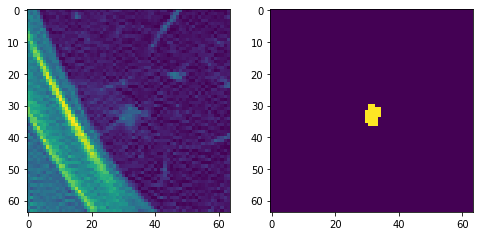

In [36]:
slc = get_nodule_part(cbbox[nodule_number], True)
slice_index = np.random.choice(range(slc[2].stop - slc[2].start))
plot_side_by_side_cropped(slc, vol, CT_mask, slice_index)

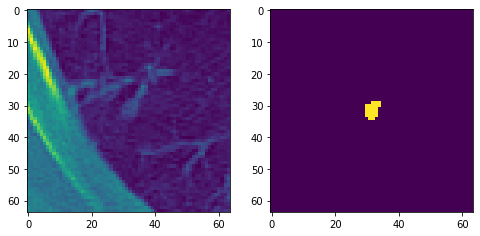

In [37]:
slc = get_nodule_part(cbbox[nodule_number], False)
slice_index = np.random.choice(range(slc[2].stop - slc[2].start))
plot_side_by_side_cropped(slc, vol, CT_mask, slice_index)

In [20]:
"""
    Save the nodule image and at least one more random image with the nodule visible 
    but not identical to the nodule image
"""
def save_image_foreach_slice(root_dir, patient_id, bounding_box, nodule_number, vol, CT_mask, random=False, image_save=False, image_plot=True):
    if image_save:
        assert os.path.exists(root_dir)
        image_dir = root_dir + '/images/'
        mask_dir = root_dir + '/masks/'
        assert os.path.exists(image_dir)
        assert os.path.exists(mask_dir)
    slc = get_nodule_part(bounding_box[nodule_number], random)
    #box = bounding_box[nodule_number]
    for slice_index in range(slc[2].stop - slc[2].start):
        img = vol[slc[0],slc[1],slc[2]][:,:,slice_index]
        mask = CT_mask[slc[0],slc[1],slc[2]][:,:,slice_index]
        if image_save:
            image_file_name = "img_{}_{}_{}.jpg".format(patient_id, nodule_number, slice_index)
            mask_file_name = "mask_{}_{}_{}.jpg".format(patient_id, nodule_number, slice_index)
            imageio.imwrite(image_dir + image_file_name)
            imageio.imwrite(mask_dir + mask_file_name)
        if image_plot:
            f, a =  plt.subplots(1,2, figsize=(8,10))
            a[0].imshow(img)
            a[1].imshow(mask)
            plt.show()

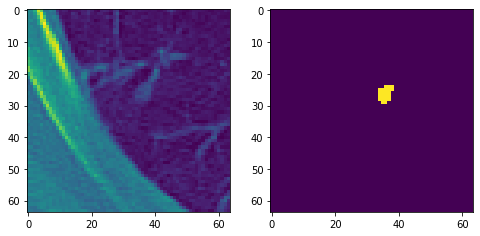

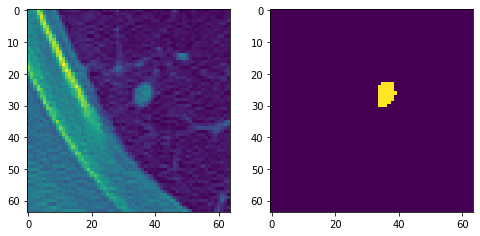

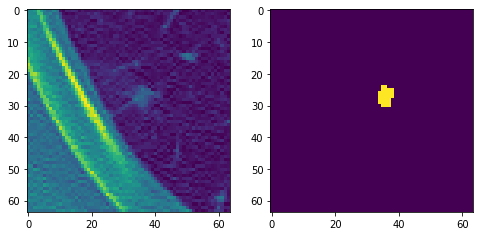

In [39]:
save_image_foreach_slice(None, None, cbbox, 0, vol, CT_mask, True, False, True)

In [21]:
import os
import contextlib
import imageio
from __future__ import print_function
import sys
from contextlib import redirect_stdout, redirect_stderr

"""
Save images and masks for nodules that have annotations from all 4 radiologists
"""
def save_image_mask_label_3(patient_id, imagedirname, labeldirname, maskdirname):
    
    devnull = open(os.devnull, 'w')
    # save all the images for the patient
    # query the image data from the CT volume
    
    scan = pl.query(pl.Scan).filter(pl.Scan.patient_id.in_([patient_id]))[0]
    nodules_annotation = scan.cluster_annotations()
    try:
        with contextlib.redirect_stdout(None):
            vol = scan.to_volume()
    except:
        print("Error loading DICOM for patient {}".format(patient_id))
        return
    
    
    # process the mask for the image
    cmask_CT = []
    cbbox_CT = []
    masks_CT = []
    for nodule_idx, nodule in enumerate(nodules_annotation):
        if len(nodule) >=4:
            cmask, cbbox, masks = consensus(nodule)
            cmask_CT.append(cmask)
            cbbox_CT.append(cbbox)
            masks_CT.append(masks)
        
    if len(cbbox_CT) <=0:
        print("No relevant nodules for patient {}".format(patient_id))
        return
    
    
    CT_mask = np.zeros_like(vol)    
    nodule_num = len(cmask_CT)
      
    for i in range(nodule_num):
        cmask = cmask_CT[i]
        cbbox = cbbox_CT[i]
        masks = masks_CT[i]
        CT_mask[cbbox] += cmask
    
    # get the slices that have annotations
    slices_with_mask = get_slices_with_masks(cbbox_CT)

    idxs = np.arange(CT_mask.shape[2])
    # get all slices that have no annotations
    compl_idxs = [idx for idx in idxs if idx not in slices_with_mask]
    SEED = 2021
    np.random.seed(SEED)
    # random sample the slices with no annotations
    np.random.shuffle(compl_idxs)
    # select equal number of non annotated slices as the number of annotated slices
    compl_idxs = compl_idxs[:len(slices_with_mask)]
    all_slices = np.union1d(slices_with_mask, compl_idxs)
    #save the images and masks and labels for only slices_with_mask and compl_idxs
    all_slices = all_slices.astype(int)

    #save images
    
    # iterate through all slices and save the images
    z_slice_cnt = 0
    #for z_slice in range(vol.shape[2]):
    for z_slice in all_slices:
        im = vol[:,:,z_slice]
        # mean normalize the image to prevent unit8 conversion errors when saving with imageio
#         im = im - np.mean(im)
#         im = im / np.std(im)
        image_filename = "{}_{}.jpg".format(patient_id, z_slice)
        with RedirectStdStreams(stdout=devnull, stderr=devnull):
            imageio.imwrite(imagedirname + "/" + image_filename, im)
        z_slice_cnt += 1
    
  
    ## NOTE: do not save the mask for Yolo training, it messed with the training
    # save all the masks
#     img_count = 0
#     for k_slice in all_slices:
#         msk = CT_mask[:,:,k_slice]
#         mask_filename = "{}_{}.jpg".format(patient_id, k_slice)

#         if not os.path.exists(maskdirname):
#             os.makedirs(maskdirname)
#         with RedirectStdStreams(stdout=devnull, stderr=devnull):
#             imageio.imwrite(maskdirname + "/" + mask_filename, msk)
#         img_count += 1
    
    
    # save bounding box labels
    #for k_slice in range(CT_mask.shape[2]):
    for k_slice in all_slices:
        msk = CT_mask[:,:,k_slice]
        boxes = get_bounding_box(msk)
        if boxes:
            for box in boxes:
                x, y, w, h = box
                center_x = (x + ((w)/2))/vol[:,:,k_slice].shape[0]
                center_y = (y + ((h)/2))/vol[:,:,k_slice].shape[1]
                width = w/vol[:,:,k_slice].shape[0]
                height = h/vol[:,:,k_slice].shape[1]

                c = 0 # there is only one class, the 'nodule'
                # save this as the label for the image for the YoloV5 object detection training
                #print("Yolov5 formatted labels are = {} {} {} {} {}".format(c, center_x, center_y, width, height))
                label = "{} {} {} {} {}".format(c, center_x, center_y, width, height)
                label_filename = "{}_{}.txt".format(patient_id, k_slice)

                f = open(labeldirname + "/" + label_filename, "a")
                f.write(label)
                f.close()
        else:
            c = 0 # there is only one class, the 'nodule'
            # save this as the label for the image for the YoloV5 object detection training
            #print("Saving empty file for patient {}".format(patient_id))
            label_filename = "{}_{}.txt".format(patient_id, k_slice)
            f = open(labeldirname + "/" + label_filename, "a")
            f.write("")
            f.close()

In [172]:
def create_dataset(patient_list, dicom_dir, root_data_dir, dtype='train'):
    #set the pylidc data config
    #data_folder = root_data_dir + '/' + dtype + '/sorted_gcsfiles/'
    print("Setting DICOM dir = {}".format(dicom_dir))
    #f = open ('.pylidcrc','w')            #For GCP
    f = open ('/root/.pylidcrc','w')    #For Colab
    f.write('[dicom]'+'\n')
    f.write('path =' + dicom_dir +'\n')
    f.write('warn = True')
    f.close()
    
    image_path = root_data_dir + '/' + dtype + '/images'
    mask_path = root_data_dir + '/' + dtype + '/masks'
    label_path = root_data_dir + '/' + dtype + '/labels'
    
    for idx, patient in tqdm(enumerate(patient_list)):
        if not os.path.exists(image_path):
            print("Removing and then creating directory {}".format(image_path))
            os.makedirs(image_path)
        if not os.path.exists(label_path):
            print("Removing and then creating directory {}".format(label_path))
            os.makedirs(label_path)
        if not os.path.exists(mask_path):
            print("Removing and then creating directory {}".format(mask_path))
            os.makedirs(mask_path)
        #NOTE: this is to be used only for testing, for training data generation, use save_image_mask_label_2 since it does not save the masks
        #for yolo training, the train folders should not contain a mask folder, just the images and the labels
        save_image_mask_label(patient, image_path, label_path, mask_path, normalize=True)
        #save_image_mask_label_2(patient, image_path, label_path, mask_path)

In [171]:
patient_list_train = os.listdir('/rawdata/train/sorted_gcsfiles/')
print("Train patients = {}".format(len(patient_list_train)))
patient_list_test = os.listdir('/data/yolov5/test/sorted_gcsfiles/')
print("Test patients = {}".format(len(patient_list_test)))
patient_list_val = os.listdir('/rawdata/yolov5/val/sorted_gcsfiles/')
print("Val patients = {}".format(len(patient_list_val)))

Train patients = 696
Test patients = 48
Val patients = 155


In [38]:
dicom_dir = '/rawdata/train/sorted_gcsfiles'
print("Setting DICOM dir = {}".format(dicom_dir))
#f = open ('.pylidcrc','w')            #For GCP
f = open ('/root/.pylidcrc','w')    #For Colab
f.write('[dicom]'+'\n')
f.write('path =' + dicom_dir +'\n')
f.write('warn = True')
f.close()

patient_id = 'LIDC-IDRI-1004'

scan = pl.query(pl.Scan).filter(pl.Scan.patient_id.in_([patient_id]))[0]
nodules_annotation = scan.cluster_annotations()

vol = scan.to_volume()

# process the mask for the image
cmask_CT = []
cbbox_CT = []
masks_CT = []
for nodule_idx, nodule in enumerate(nodules_annotation):
    if len(nodule) >=4:
        cmask, cbbox, masks = consensus(nodule)
        cmask_CT.append(cmask)
        cbbox_CT.append(cbbox)
        masks_CT.append(masks)

if len(cbbox_CT) <=0:
    print("No relevant nodules for patient {}".format(patient_id))


CT_mask = np.zeros_like(vol)    
nodule_num = len(cmask_CT)

for i in range(nodule_num):
    cmask = cmask_CT[i]
    cbbox = cbbox_CT[i]
    masks = masks_CT[i]
    CT_mask[cbbox] += cmask

# get the slices that have annotations
slices_with_mask = get_slices_with_masks(cbbox_CT)

slices_with_mask

Setting DICOM dir = /rawdata/train/sorted_gcsfiles
Loading dicom files ... This may take a moment.


array([295., 296., 297., 298., 299., 300., 301., 302., 367., 368., 369.,
       370., 371., 372., 373., 374., 375., 376., 377., 378., 379., 380.,
       381., 382., 383., 384., 385., 386., 387., 388., 389., 390., 391.,
       392., 393., 394., 395.])

#### Challenge with data preparation

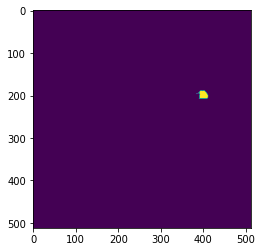

In [47]:
plt.imshow(CT_mask[:,:,387])

In [48]:
get_bounding_box(CT_mask[:,:,387])

[(387.5, 188.5, 23.0, 19.0),
 (386.5, 194.5, 1.0, 1.0),
 (383.5, 195.5, 2.0, 1.0)]

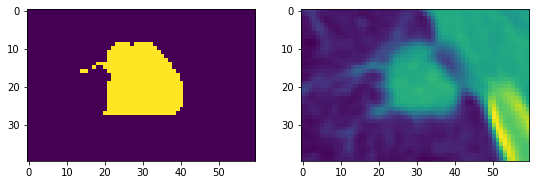

In [106]:
#plt.imshow(CT_mask[slice(180, 220, None), slice(370, 430, None)][:,:,387])
cropped_mask = CT_mask[slice(180, 220, None), slice(370, 430, None)][:,:,387]
cropped_image = vol[slice(180, 220, None), slice(370, 430, None)][:,:,387]
f, a = plt.subplots(1,2, figsize=(9,6))
a[0].imshow(cropped_mask)
a[1].imshow(cropped_image)

# for c in find_contours(cropped_mask.astype(float), 0.5):
#     a[2].plot(c[:,1], c[:,0])
    
#plt.gca().invert_yaxis()
# for j in range(len(masks)):
#     for c in find_contours(masks[j][:,:,k].astype(float), 0.5):
#         label = "Annotation %d" % (j+1)
#         plt.plot(c[:,1], c[:,0], colors[j], label=label)

In [110]:
### check the distribution of the data with issues
train_labels = os.listdir('/data/yolov5/train/labels')

In [115]:
m = {}
for file in train_labels:
    sz = os.path.getsize('/data/yolov5/train/labels/' + file)
    if file in m.keys():
        m[file].append(sz)
    else:
        m[file] = sz

In [125]:
cnt_0 = 0
cnt_1 = 0
cnt_2 = 0
cnt_3 = 0
for k in m.keys():
    if m[k] <=0:
        cnt_0 += 1
    if m[k] > 0 and m[k] <= 50:
        cnt_1 += 1
    elif m[k] > 50 and m[k] < 100:
        cnt_2 += 1
    else:
        cnt_3 += 1

Text(0.5, 1.0, 'Distribution of bounding box count in train dataset')

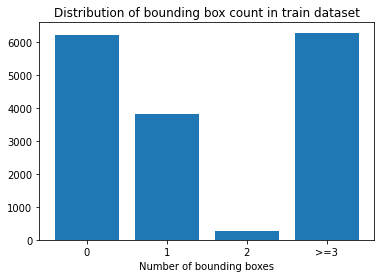

In [139]:
f, a = plt.subplots()
a.bar(['0','1','2','>=3'], [cnt_0, cnt_1, cnt_2, cnt_3])
a.set_xlabel('Number of bounding boxes')
a.set_title('Distribution of bounding box count in train dataset')

In [173]:
# train gcs files dir = /rawdata/train/sorted_gcsfiles = dicom dir
create_dataset(patient_list_train, '/rawdata/train/sorted_gcsfiles', '/data/yolov5/normalized/', 'train')
#create the masks and labels for the inference pipeline of the unet + yolov model
#create_dataset(patient_list_train, '/rawdata/train/sorted_gcsfiles', '/data/unet/fullsize/', 'train')

Setting DICOM dir = /rawdata/train/sorted_gcsfiles


0it [00:00, ?it/s]

Removing and then creating directory /data/yolov5/normalized//train/masks


1it [00:02,  2.82s/it]

No relevant nodules for patient LIDC-IDRI-0971


2it [00:07,  4.14s/it]

No relevant nodules for patient LIDC-IDRI-0856


3it [00:13,  5.04s/it]

No relevant nodules for patient LIDC-IDRI-0826


6it [00:24,  3.42s/it]

No relevant nodules for patient LIDC-IDRI-0584


8it [00:31,  3.61s/it]

No relevant nodules for patient LIDC-IDRI-0859


11it [00:38,  2.89s/it]

No relevant nodules for patient LIDC-IDRI-0654


14it [00:45,  2.63s/it]

No relevant nodules for patient LIDC-IDRI-0662


17it [00:51,  2.07s/it]

No relevant nodules for patient LIDC-IDRI-0670


18it [00:52,  1.82s/it]

No relevant nodules for patient LIDC-IDRI-0157


20it [00:59,  2.57s/it]

No relevant nodules for patient LIDC-IDRI-0019


25it [01:21,  4.01s/it]

No relevant nodules for patient LIDC-IDRI-0575


26it [01:22,  3.18s/it]

No relevant nodules for patient LIDC-IDRI-0680


28it [01:29,  3.28s/it]

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


30it [01:33,  2.65s/it]

No relevant nodules for patient LIDC-IDRI-0457


32it [01:38,  2.71s/it]

No relevant nodules for patient LIDC-IDRI-0839


33it [01:40,  2.52s/it]

No relevant nodules for patient LIDC-IDRI-0979


37it [01:51,  2.44s/it]

No relevant nodules for patient LIDC-IDRI-0180


38it [01:56,  3.07s/it]

No relevant nodules for patient LIDC-IDRI-0397


43it [02:17,  3.57s/it]

No relevant nodules for patient LIDC-IDRI-0291


46it [02:23,  2.37s/it]

No relevant nodules for patient LIDC-IDRI-0927


47it [02:25,  2.33s/it]

No relevant nodules for patient LIDC-IDRI-0307


48it [02:27,  2.11s/it]

No relevant nodules for patient LIDC-IDRI-0885


49it [02:28,  1.87s/it]

No relevant nodules for patient LIDC-IDRI-0677


50it [02:29,  1.65s/it]

No relevant nodules for patient LIDC-IDRI-0261


52it [02:35,  2.18s/it]

No relevant nodules for patient LIDC-IDRI-0666


53it [02:39,  2.67s/it]

No relevant nodules for patient LIDC-IDRI-0468


54it [02:40,  2.23s/it]

No relevant nodules for patient LIDC-IDRI-0243


56it [02:44,  2.23s/it]

No relevant nodules for patient LIDC-IDRI-0736


57it [02:46,  2.08s/it]

No relevant nodules for patient LIDC-IDRI-0852


60it [02:53,  2.19s/it]

No relevant nodules for patient LIDC-IDRI-0881


67it [03:17,  3.11s/it]

No relevant nodules for patient LIDC-IDRI-0324


68it [03:18,  2.52s/it]

No relevant nodules for patient LIDC-IDRI-0173


69it [03:21,  2.41s/it]

No relevant nodules for patient LIDC-IDRI-0304


72it [03:30,  2.73s/it]

No relevant nodules for patient LIDC-IDRI-0958


73it [03:32,  2.30s/it]

No relevant nodules for patient LIDC-IDRI-0638


80it [04:08,  3.88s/it]

No relevant nodules for patient LIDC-IDRI-0062


89it [04:30,  2.52s/it]

No relevant nodules for patient LIDC-IDRI-0414


91it [04:35,  2.63s/it]

No relevant nodules for patient LIDC-IDRI-0870


94it [04:40,  1.92s/it]

No relevant nodules for patient LIDC-IDRI-0143


95it [04:45,  2.91s/it]

No relevant nodules for patient LIDC-IDRI-0328


97it [04:51,  3.01s/it]

No relevant nodules for patient LIDC-IDRI-0424


98it [04:52,  2.44s/it]

No relevant nodules for patient LIDC-IDRI-0494


100it [04:59,  3.09s/it]

No relevant nodules for patient LIDC-IDRI-0293


101it [05:01,  2.50s/it]

No relevant nodules for patient LIDC-IDRI-0891


102it [05:03,  2.59s/it]

No relevant nodules for patient LIDC-IDRI-0888


103it [05:08,  3.07s/it]

No relevant nodules for patient LIDC-IDRI-0669


105it [05:12,  2.58s/it]

No relevant nodules for patient LIDC-IDRI-0783


106it [05:14,  2.51s/it]

No relevant nodules for patient LIDC-IDRI-0774


107it [05:15,  2.11s/it]

No relevant nodules for patient LIDC-IDRI-0035


113it [05:40,  4.51s/it]

No relevant nodules for patient LIDC-IDRI-0623


115it [05:44,  3.24s/it]

No relevant nodules for patient LIDC-IDRI-0514


117it [05:56,  4.45s/it]

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


119it [06:04,  4.10s/it]

No relevant nodules for patient LIDC-IDRI-0136


120it [06:06,  3.38s/it]

No relevant nodules for patient LIDC-IDRI-0218


123it [06:18,  3.47s/it]

No relevant nodules for patient LIDC-IDRI-0934
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


128it [06:32,  2.97s/it]

No relevant nodules for patient LIDC-IDRI-0995


129it [06:34,  2.78s/it]

No relevant nodules for patient LIDC-IDRI-0029


134it [06:53,  3.59s/it]

No relevant nodules for patient LIDC-IDRI-0663


138it [07:04,  3.24s/it]

No relevant nodules for patient LIDC-IDRI-0370


140it [07:07,  2.43s/it]

No relevant nodules for patient LIDC-IDRI-0612


141it [07:09,  2.17s/it]

No relevant nodules for patient LIDC-IDRI-0787


144it [07:18,  2.72s/it]

No relevant nodules for patient LIDC-IDRI-0247


145it [07:23,  3.40s/it]

No relevant nodules for patient LIDC-IDRI-0831


150it [07:44,  3.77s/it]

No relevant nodules for patient LIDC-IDRI-0950


153it [07:56,  4.03s/it]

No relevant nodules for patient LIDC-IDRI-0757


160it [08:19,  3.09s/it]

No relevant nodules for patient LIDC-IDRI-0563


161it [08:22,  3.17s/it]

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


167it [08:51,  4.89s/it]

No relevant nodules for patient LIDC-IDRI-0897


169it [09:00,  4.73s/it]

No relevant nodules for patient LIDC-IDRI-0664


170it [09:01,  3.58s/it]

No relevant nodules for patient LIDC-IDRI-0544


173it [09:06,  2.30s/it]

No relevant nodules for patient LIDC-IDRI-0279


178it [09:17,  1.93s/it]

No relevant nodules for patient LIDC-IDRI-0290


179it [09:18,  1.69s/it]

No relevant nodules for patient LIDC-IDRI-0679


183it [09:29,  2.52s/it]

No relevant nodules for patient LIDC-IDRI-0824


184it [09:31,  2.45s/it]

No relevant nodules for patient LIDC-IDRI-0100


186it [09:37,  2.67s/it]

No relevant nodules for patient LIDC-IDRI-0547


188it [09:44,  3.00s/it]

No relevant nodules for patient LIDC-IDRI-0567


190it [09:47,  2.18s/it]

No relevant nodules for patient LIDC-IDRI-0174


192it [09:50,  1.89s/it]

No relevant nodules for patient LIDC-IDRI-0322


196it [09:58,  1.88s/it]

No relevant nodules for patient LIDC-IDRI-0977


201it [10:10,  2.01s/it]

No relevant nodules for patient LIDC-IDRI-0687


205it [10:25,  3.27s/it]

No relevant nodules for patient LIDC-IDRI-0731


207it [10:31,  3.05s/it]

No relevant nodules for patient LIDC-IDRI-0737


208it [10:32,  2.40s/it]

No relevant nodules for patient LIDC-IDRI-0389


210it [10:41,  3.46s/it]

No relevant nodules for patient LIDC-IDRI-0371


213it [10:46,  2.27s/it]

No relevant nodules for patient LIDC-IDRI-0289


214it [10:48,  2.30s/it]

No relevant nodules for patient LIDC-IDRI-0082


215it [10:51,  2.32s/it]

No relevant nodules for patient LIDC-IDRI-0802


219it [11:02,  2.60s/it]

No relevant nodules for patient LIDC-IDRI-0786


222it [11:13,  2.85s/it]

No relevant nodules for patient LIDC-IDRI-0721


233it [11:52,  4.19s/it]

No relevant nodules for patient LIDC-IDRI-0844


234it [11:53,  3.21s/it]

No relevant nodules for patient LIDC-IDRI-0381


235it [11:56,  3.03s/it]

No relevant nodules for patient LIDC-IDRI-0444


237it [11:59,  2.39s/it]

No relevant nodules for patient LIDC-IDRI-0878


238it [12:00,  1.98s/it]

No relevant nodules for patient LIDC-IDRI-0351


239it [12:02,  1.96s/it]

No relevant nodules for patient LIDC-IDRI-0917


240it [12:03,  1.73s/it]

No relevant nodules for patient LIDC-IDRI-0401


241it [12:05,  1.71s/it]

No relevant nodules for patient LIDC-IDRI-0817


242it [12:06,  1.51s/it]

No relevant nodules for patient LIDC-IDRI-0391


243it [12:07,  1.43s/it]

No relevant nodules for patient LIDC-IDRI-0842


245it [12:14,  2.29s/it]

No relevant nodules for patient LIDC-IDRI-0816


247it [12:22,  2.89s/it]

No relevant nodules for patient LIDC-IDRI-0738


248it [12:24,  2.77s/it]

No relevant nodules for patient LIDC-IDRI-0984


252it [12:38,  3.22s/it]

No relevant nodules for patient LIDC-IDRI-0899


253it [12:42,  3.44s/it]

No relevant nodules for patient LIDC-IDRI-0639


257it [13:02,  5.11s/it]

No relevant nodules for patient LIDC-IDRI-0715
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


260it [13:12,  3.61s/it]

No relevant nodules for patient LIDC-IDRI-0477


265it [13:22,  2.39s/it]

No relevant nodules for patient LIDC-IDRI-0034


266it [13:24,  2.39s/it]

No relevant nodules for patient LIDC-IDRI-0459


268it [13:28,  2.09s/it]

No relevant nodules for patient LIDC-IDRI-0512


275it [13:45,  2.33s/it]

No relevant nodules for patient LIDC-IDRI-0675


276it [13:47,  2.04s/it]

No relevant nodules for patient LIDC-IDRI-0846


279it [13:54,  2.05s/it]

No relevant nodules for patient LIDC-IDRI-0948


284it [14:10,  3.02s/it]

No relevant nodules for patient LIDC-IDRI-0532


286it [14:17,  3.18s/it]

No relevant nodules for patient LIDC-IDRI-0432


288it [14:20,  2.53s/it]

No relevant nodules for patient LIDC-IDRI-0147


294it [14:40,  2.85s/it]

No relevant nodules for patient LIDC-IDRI-0954


295it [14:41,  2.34s/it]

No relevant nodules for patient LIDC-IDRI-0030


298it [14:49,  2.27s/it]

No relevant nodules for patient LIDC-IDRI-0087


299it [14:54,  3.06s/it]

No relevant nodules for patient LIDC-IDRI-0327


308it [15:27,  3.04s/it]

No relevant nodules for patient LIDC-IDRI-0943


311it [15:40,  3.63s/it]

No relevant nodules for patient LIDC-IDRI-0096
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


313it [15:44,  2.89s/it]

No relevant nodules for patient LIDC-IDRI-0571


314it [15:45,  2.34s/it]

No relevant nodules for patient LIDC-IDRI-0357


316it [15:51,  2.49s/it]

No relevant nodules for patient LIDC-IDRI-0413


322it [16:15,  3.78s/it]

No relevant nodules for patient LIDC-IDRI-0805


324it [16:19,  2.90s/it]

No relevant nodules for patient LIDC-IDRI-0519


327it [16:24,  2.26s/it]

No relevant nodules for patient LIDC-IDRI-0458


328it [16:27,  2.21s/it]

No relevant nodules for patient LIDC-IDRI-0848


335it [16:45,  2.42s/it]

No relevant nodules for patient LIDC-IDRI-0295


336it [16:47,  2.33s/it]

No relevant nodules for patient LIDC-IDRI-0207


339it [16:57,  2.98s/it]

No relevant nodules for patient LIDC-IDRI-0510


341it [17:02,  2.67s/it]

No relevant nodules for patient LIDC-IDRI-0320


342it [17:04,  2.64s/it]

No relevant nodules for patient LIDC-IDRI-0797


344it [17:11,  3.14s/it]

No relevant nodules for patient LIDC-IDRI-0784


345it [17:14,  3.11s/it]

No relevant nodules for patient LIDC-IDRI-0703


346it [17:15,  2.44s/it]

No relevant nodules for patient LIDC-IDRI-0355


347it [17:18,  2.64s/it]

No relevant nodules for patient LIDC-IDRI-0493


348it [17:19,  2.20s/it]

No relevant nodules for patient LIDC-IDRI-0449


350it [17:25,  2.38s/it]

No relevant nodules for patient LIDC-IDRI-0275


354it [17:38,  2.49s/it]

No relevant nodules for patient LIDC-IDRI-0198


355it [17:40,  2.45s/it]

No relevant nodules for patient LIDC-IDRI-0718


356it [17:43,  2.68s/it]

No relevant nodules for patient LIDC-IDRI-0781


361it [18:00,  2.92s/it]

No relevant nodules for patient LIDC-IDRI-0345


363it [18:03,  2.24s/it]

No relevant nodules for patient LIDC-IDRI-0570


364it [18:05,  2.21s/it]

No relevant nodules for patient LIDC-IDRI-0280


365it [18:07,  2.02s/it]

No relevant nodules for patient LIDC-IDRI-0779


368it [18:12,  1.72s/it]

No relevant nodules for patient LIDC-IDRI-0901


369it [18:15,  2.00s/it]

No relevant nodules for patient LIDC-IDRI-0269


372it [18:34,  4.69s/it]

No relevant nodules for patient LIDC-IDRI-0665


375it [18:41,  2.92s/it]

No relevant nodules for patient LIDC-IDRI-0868


377it [18:47,  3.08s/it]

No relevant nodules for patient LIDC-IDRI-0667


379it [18:52,  2.85s/it]

No relevant nodules for patient LIDC-IDRI-0455


380it [18:54,  2.37s/it]

No relevant nodules for patient LIDC-IDRI-0074


383it [19:01,  2.21s/it]

No relevant nodules for patient LIDC-IDRI-0070


385it [19:07,  2.64s/it]

No relevant nodules for patient LIDC-IDRI-0267


386it [19:08,  2.16s/it]

No relevant nodules for patient LIDC-IDRI-0253


389it [19:23,  3.84s/it]

No relevant nodules for patient LIDC-IDRI-0155


390it [19:26,  3.80s/it]

No relevant nodules for patient LIDC-IDRI-0922


391it [19:29,  3.58s/it]

No relevant nodules for patient LIDC-IDRI-0540


397it [20:01,  5.10s/it]

No relevant nodules for patient LIDC-IDRI-0739


399it [20:05,  3.66s/it]

No relevant nodules for patient LIDC-IDRI-0466


400it [20:07,  3.17s/it]

No relevant nodules for patient LIDC-IDRI-0725


403it [20:18,  3.32s/it]

No relevant nodules for patient LIDC-IDRI-0499


408it [20:34,  3.27s/it]

No relevant nodules for patient LIDC-IDRI-0829


410it [20:38,  2.57s/it]

No relevant nodules for patient LIDC-IDRI-0511


411it [20:41,  2.53s/it]

No relevant nodules for patient LIDC-IDRI-0352


412it [20:43,  2.28s/it]

No relevant nodules for patient LIDC-IDRI-0425


414it [20:47,  2.11s/it]

No relevant nodules for patient LIDC-IDRI-0516


416it [20:52,  2.29s/it]

No relevant nodules for patient LIDC-IDRI-0361


418it [20:55,  1.76s/it]

No relevant nodules for patient LIDC-IDRI-0691


421it [21:04,  2.44s/it]

No relevant nodules for patient LIDC-IDRI-0333


423it [21:06,  1.81s/it]

No relevant nodules for patient LIDC-IDRI-0588


424it [21:08,  1.65s/it]

No relevant nodules for patient LIDC-IDRI-0113


425it [21:13,  2.89s/it]

No relevant nodules for patient LIDC-IDRI-0756


426it [21:15,  2.64s/it]

No relevant nodules for patient LIDC-IDRI-0120


431it [21:28,  2.34s/it]

No relevant nodules for patient LIDC-IDRI-0552


434it [21:36,  2.60s/it]

No relevant nodules for patient LIDC-IDRI-0072


435it [21:37,  2.12s/it]

No relevant nodules for patient LIDC-IDRI-0903


436it [21:40,  2.35s/it]

No relevant nodules for patient LIDC-IDRI-0048


437it [21:41,  2.04s/it]

No relevant nodules for patient LIDC-IDRI-0970


439it [21:49,  3.02s/it]

No relevant nodules for patient LIDC-IDRI-0553


444it [22:01,  2.35s/it]

No relevant nodules for patient LIDC-IDRI-0989


447it [22:06,  1.82s/it]

No relevant nodules for patient LIDC-IDRI-0225


448it [22:08,  1.67s/it]

No relevant nodules for patient LIDC-IDRI-0167


452it [22:20,  2.23s/it]

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


453it [22:22,  2.14s/it]

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


455it [22:28,  2.67s/it]

No relevant nodules for patient LIDC-IDRI-0710


456it [22:31,  2.80s/it]

No relevant nodules for patient LIDC-IDRI-0924


457it [22:33,  2.65s/it]

No relevant nodules for patient LIDC-IDRI-0138


458it [22:37,  3.11s/it]

No relevant nodules for patient LIDC-IDRI-0913


461it [22:47,  3.12s/it]

No relevant nodules for patient LIDC-IDRI-0883


462it [22:49,  2.74s/it]

No relevant nodules for patient LIDC-IDRI-0591


466it [23:00,  2.50s/it]

No relevant nodules for patient LIDC-IDRI-0627


468it [23:05,  2.35s/it]

No relevant nodules for patient LIDC-IDRI-0652


469it [23:06,  2.01s/it]

No relevant nodules for patient LIDC-IDRI-0256


470it [23:09,  2.20s/it]

No relevant nodules for patient LIDC-IDRI-0393


482it [23:56,  3.47s/it]

No relevant nodules for patient LIDC-IDRI-0539


484it [24:01,  3.00s/it]

No relevant nodules for patient LIDC-IDRI-1006


486it [24:06,  2.47s/it]

No relevant nodules for patient LIDC-IDRI-0303


488it [24:12,  2.72s/it]

No relevant nodules for patient LIDC-IDRI-0339


491it [24:16,  1.90s/it]

No relevant nodules for patient LIDC-IDRI-0993


493it [24:20,  1.97s/it]

No relevant nodules for patient LIDC-IDRI-0153


494it [24:22,  1.86s/it]

No relevant nodules for patient LIDC-IDRI-0769


495it [24:25,  2.05s/it]

No relevant nodules for patient LIDC-IDRI-0071


498it [24:34,  2.89s/it]

No relevant nodules for patient LIDC-IDRI-0990


499it [24:40,  3.78s/it]

No relevant nodules for patient LIDC-IDRI-0301


501it [24:45,  3.02s/it]

No relevant nodules for patient LIDC-IDRI-0312


503it [24:49,  2.41s/it]

No relevant nodules for patient LIDC-IDRI-0862


504it [24:51,  2.35s/it]

No relevant nodules for patient LIDC-IDRI-0084


505it [24:53,  2.26s/it]

No relevant nodules for patient LIDC-IDRI-0973


509it [25:15,  4.38s/it]

No relevant nodules for patient LIDC-IDRI-0626


511it [25:22,  3.68s/it]

No relevant nodules for patient LIDC-IDRI-0653


513it [25:24,  2.42s/it]

No relevant nodules for patient LIDC-IDRI-0847


514it [25:27,  2.40s/it]

No relevant nodules for patient LIDC-IDRI-0743


516it [25:31,  2.17s/it]

No relevant nodules for patient LIDC-IDRI-0257


518it [25:38,  2.86s/it]

No relevant nodules for patient LIDC-IDRI-0955


525it [25:57,  2.77s/it]

No relevant nodules for patient LIDC-IDRI-0754


526it [26:00,  3.04s/it]

No relevant nodules for patient LIDC-IDRI-0388


530it [26:12,  2.65s/it]

No relevant nodules for patient LIDC-IDRI-0150


532it [26:16,  2.35s/it]

No relevant nodules for patient LIDC-IDRI-0932


534it [26:19,  2.01s/it]

No relevant nodules for patient LIDC-IDRI-0574


536it [26:25,  2.29s/it]

No relevant nodules for patient LIDC-IDRI-0022


537it [26:26,  1.87s/it]

No relevant nodules for patient LIDC-IDRI-0268


539it [26:36,  3.54s/it]

No relevant nodules for patient LIDC-IDRI-0520


543it [26:51,  3.02s/it]

No relevant nodules for patient LIDC-IDRI-0131


548it [27:07,  2.92s/it]

No relevant nodules for patient LIDC-IDRI-0522


551it [27:16,  2.57s/it]

No relevant nodules for patient LIDC-IDRI-1009


552it [27:17,  2.17s/it]

No relevant nodules for patient LIDC-IDRI-0632


554it [27:22,  2.21s/it]

No relevant nodules for patient LIDC-IDRI-0178


559it [27:40,  3.43s/it]

No relevant nodules for patient LIDC-IDRI-0176


560it [27:42,  3.01s/it]

No relevant nodules for patient LIDC-IDRI-0930


561it [27:43,  2.41s/it]

No relevant nodules for patient LIDC-IDRI-0804


563it [27:46,  1.83s/it]

No relevant nodules for patient LIDC-IDRI-0417


566it [27:55,  2.38s/it]

No relevant nodules for patient LIDC-IDRI-0065


567it [27:56,  2.06s/it]

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


570it [28:03,  2.19s/it]

No relevant nodules for patient LIDC-IDRI-0474


571it [28:08,  2.99s/it]

No relevant nodules for patient LIDC-IDRI-0981


573it [28:16,  3.29s/it]

No relevant nodules for patient LIDC-IDRI-0214


576it [28:26,  3.06s/it]

No relevant nodules for patient LIDC-IDRI-0983


579it [28:36,  2.93s/it]

No relevant nodules for patient LIDC-IDRI-0833


580it [28:39,  3.01s/it]

No relevant nodules for patient LIDC-IDRI-0968


581it [28:41,  2.57s/it]

No relevant nodules for patient LIDC-IDRI-0622


582it [28:42,  2.16s/it]

No relevant nodules for patient LIDC-IDRI-0232


583it [28:47,  3.15s/it]

No relevant nodules for patient LIDC-IDRI-0909


584it [28:53,  3.74s/it]

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


586it [28:59,  3.31s/it]

No relevant nodules for patient LIDC-IDRI-0330


587it [29:00,  2.60s/it]

No relevant nodules for patient LIDC-IDRI-0755


589it [29:04,  2.23s/it]

No relevant nodules for patient LIDC-IDRI-0560


592it [29:12,  2.27s/it]

No relevant nodules for patient LIDC-IDRI-0531


598it [29:30,  3.49s/it]

No relevant nodules for patient LIDC-IDRI-0384


599it [29:31,  2.91s/it]

No relevant nodules for patient LIDC-IDRI-0813


600it [29:34,  2.94s/it]

No relevant nodules for patient LIDC-IDRI-0808


606it [30:02,  3.84s/it]

No relevant nodules for patient LIDC-IDRI-0316


613it [30:19,  2.15s/it]

No relevant nodules for patient LIDC-IDRI-0245


614it [30:22,  2.14s/it]

No relevant nodules for patient LIDC-IDRI-0416


616it [30:24,  1.63s/it]

No relevant nodules for patient LIDC-IDRI-0668


618it [30:27,  1.63s/it]

No relevant nodules for patient LIDC-IDRI-0747


621it [30:36,  2.15s/it]

No relevant nodules for patient LIDC-IDRI-0630


622it [30:37,  1.81s/it]

No relevant nodules for patient LIDC-IDRI-0151


624it [30:43,  2.28s/it]

No relevant nodules for patient LIDC-IDRI-0600


626it [30:49,  2.77s/it]

No relevant nodules for patient LIDC-IDRI-0446


627it [30:50,  2.28s/it]

No relevant nodules for patient LIDC-IDRI-0431


629it [30:54,  2.10s/it]

No relevant nodules for patient LIDC-IDRI-0399


630it [30:55,  1.82s/it]

No relevant nodules for patient LIDC-IDRI-0716


631it [30:57,  1.64s/it]

No relevant nodules for patient LIDC-IDRI-0765


632it [30:58,  1.47s/it]

No relevant nodules for patient LIDC-IDRI-0992


633it [30:59,  1.45s/it]

No relevant nodules for patient LIDC-IDRI-0105


637it [31:14,  2.86s/it]

No relevant nodules for patient LIDC-IDRI-0611


640it [31:28,  3.57s/it]

No relevant nodules for patient LIDC-IDRI-0988


641it [31:30,  3.07s/it]

No relevant nodules for patient LIDC-IDRI-0877


643it [31:39,  4.05s/it]

No relevant nodules for patient LIDC-IDRI-0373


644it [31:43,  4.00s/it]

No relevant nodules for patient LIDC-IDRI-0792


645it [31:45,  3.47s/it]

No relevant nodules for patient LIDC-IDRI-0123


646it [31:47,  3.00s/it]

No relevant nodules for patient LIDC-IDRI-0418


647it [31:48,  2.37s/it]

No relevant nodules for patient LIDC-IDRI-0593


649it [31:54,  2.58s/it]

No relevant nodules for patient LIDC-IDRI-0650


652it [32:05,  3.17s/it]

No relevant nodules for patient LIDC-IDRI-0428


658it [32:17,  1.94s/it]

No relevant nodules for patient LIDC-IDRI-0306


659it [32:23,  3.22s/it]

No relevant nodules for patient LIDC-IDRI-0947


660it [32:24,  2.57s/it]

No relevant nodules for patient LIDC-IDRI-0683


662it [32:31,  2.77s/it]

No relevant nodules for patient LIDC-IDRI-0745


663it [32:32,  2.28s/it]

No relevant nodules for patient LIDC-IDRI-0616


664it [32:34,  2.25s/it]

No relevant nodules for patient LIDC-IDRI-0032


667it [32:40,  2.01s/it]

No relevant nodules for patient LIDC-IDRI-0342


668it [32:46,  3.01s/it]

No relevant nodules for patient LIDC-IDRI-0728


669it [32:47,  2.41s/it]

No relevant nodules for patient LIDC-IDRI-0972


670it [32:51,  3.02s/it]

No relevant nodules for patient LIDC-IDRI-0778


672it [32:55,  2.48s/it]

No relevant nodules for patient LIDC-IDRI-0790


673it [32:59,  3.16s/it]

No relevant nodules for patient LIDC-IDRI-0460


674it [33:02,  2.91s/it]

No relevant nodules for patient LIDC-IDRI-0266


676it [33:04,  2.09s/it]

No relevant nodules for patient LIDC-IDRI-0506


679it [33:11,  2.05s/it]

No relevant nodules for patient LIDC-IDRI-0165


680it [33:17,  3.36s/it]

No relevant nodules for patient LIDC-IDRI-0702


681it [33:19,  2.87s/it]

No relevant nodules for patient LIDC-IDRI-0634


686it [33:28,  2.00s/it]

No relevant nodules for patient LIDC-IDRI-0931


687it [33:31,  2.24s/it]

No relevant nodules for patient LIDC-IDRI-0762


689it [33:42,  3.82s/it]

No relevant nodules for patient LIDC-IDRI-0758


690it [33:43,  3.02s/it]

No relevant nodules for patient LIDC-IDRI-0482


692it [33:50,  3.03s/it]

No relevant nodules for patient LIDC-IDRI-0554


693it [33:51,  2.48s/it]

No relevant nodules for patient LIDC-IDRI-0224


695it [33:56,  2.44s/it]

No relevant nodules for patient LIDC-IDRI-0830


696it [33:58,  2.93s/it]

No relevant nodules for patient LIDC-IDRI-0374


In [174]:
# val gcs files dir = /rawdata/yolov5/val/sorted_gcsfiles = dicom dir
create_dataset(patient_list_val, '/rawdata/yolov5/val/sorted_gcsfiles/', '/rawdata/yolov5/normalized', 'val')
#create the masks and labels for the inference pipeline of the unet + yolov model
#create_dataset(patient_list_val, '/rawdata/yolov5/val/sorted_gcsfiles/', '/data/unet/fullsize/', 'val')

Setting DICOM dir = /rawdata/yolov5/val/sorted_gcsfiles/


0it [00:00, ?it/s]

Removing and then creating directory /rawdata/yolov5/normalized/val/images
Removing and then creating directory /rawdata/yolov5/normalized/val/labels
Removing and then creating directory /rawdata/yolov5/normalized/val/masks


1it [00:01,  1.98s/it]

No relevant nodules for patient LIDC-IDRI-0026


2it [00:02,  1.40s/it]

No relevant nodules for patient LIDC-IDRI-0471


5it [00:12,  2.73s/it]

No relevant nodules for patient LIDC-IDRI-0820


6it [00:13,  2.20s/it]

No relevant nodules for patient LIDC-IDRI-0166


7it [00:15,  2.14s/it]

No relevant nodules for patient LIDC-IDRI-0002


8it [00:17,  2.02s/it]

No relevant nodules for patient LIDC-IDRI-0714


9it [00:18,  1.64s/it]

No relevant nodules for patient LIDC-IDRI-0396


10it [00:19,  1.42s/it]

No relevant nodules for patient LIDC-IDRI-0823


11it [00:20,  1.22s/it]

No relevant nodules for patient LIDC-IDRI-0873


16it [00:36,  2.20s/it]

No relevant nodules for patient LIDC-IDRI-0607


18it [00:38,  1.63s/it]

No relevant nodules for patient LIDC-IDRI-0561


20it [00:47,  2.79s/it]

No relevant nodules for patient LIDC-IDRI-0753


25it [01:04,  2.55s/it]

No relevant nodules for patient LIDC-IDRI-0197


28it [01:10,  2.26s/it]

No relevant nodules for patient LIDC-IDRI-0746


29it [01:12,  2.01s/it]

No relevant nodules for patient LIDC-IDRI-0139


32it [01:17,  1.74s/it]

No relevant nodules for patient LIDC-IDRI-0383


34it [01:24,  2.78s/it]

No relevant nodules for patient LIDC-IDRI-0876


35it [01:25,  2.23s/it]

No relevant nodules for patient LIDC-IDRI-0410


36it [01:26,  1.83s/it]

No relevant nodules for patient LIDC-IDRI-0548


37it [01:27,  1.56s/it]

No relevant nodules for patient LIDC-IDRI-0127


39it [01:30,  1.51s/it]

No relevant nodules for patient LIDC-IDRI-0098


40it [01:31,  1.31s/it]

No relevant nodules for patient LIDC-IDRI-0685


41it [01:31,  1.14s/it]

No relevant nodules for patient LIDC-IDRI-0887


42it [01:32,  1.08s/it]

No relevant nodules for patient LIDC-IDRI-0329


43it [01:36,  1.98s/it]

No relevant nodules for patient LIDC-IDRI-0960


47it [01:51,  3.50s/it]

No relevant nodules for patient LIDC-IDRI-0292


49it [01:56,  2.84s/it]

No relevant nodules for patient LIDC-IDRI-0558


50it [01:57,  2.50s/it]

No relevant nodules for patient LIDC-IDRI-0959


51it [01:59,  2.30s/it]

No relevant nodules for patient LIDC-IDRI-0025


52it [02:00,  1.79s/it]

No relevant nodules for patient LIDC-IDRI-0937


57it [02:11,  1.95s/it]

No relevant nodules for patient LIDC-IDRI-0692


58it [02:14,  2.01s/it]

No relevant nodules for patient LIDC-IDRI-0483


62it [02:28,  2.78s/it]

No relevant nodules for patient LIDC-IDRI-0288
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


64it [02:32,  2.43s/it]

No relevant nodules for patient LIDC-IDRI-0969


65it [02:33,  1.99s/it]

No relevant nodules for patient LIDC-IDRI-0764


66it [02:37,  2.51s/it]

No relevant nodules for patient LIDC-IDRI-0545


67it [02:37,  1.96s/it]

No relevant nodules for patient LIDC-IDRI-0382


69it [02:42,  1.94s/it]

No relevant nodules for patient LIDC-IDRI-0110


70it [02:43,  1.67s/it]

No relevant nodules for patient LIDC-IDRI-0534


71it [02:45,  1.81s/it]

No relevant nodules for patient LIDC-IDRI-0605


72it [02:46,  1.50s/it]

No relevant nodules for patient LIDC-IDRI-0690


74it [02:53,  2.35s/it]

No relevant nodules for patient LIDC-IDRI-0841


75it [02:54,  1.88s/it]

No relevant nodules for patient LIDC-IDRI-0693


76it [02:57,  2.30s/it]

No relevant nodules for patient LIDC-IDRI-0479


78it [03:00,  1.78s/it]

No relevant nodules for patient LIDC-IDRI-0378


80it [03:05,  2.11s/it]

No relevant nodules for patient LIDC-IDRI-0834


81it [03:06,  1.82s/it]

No relevant nodules for patient LIDC-IDRI-0349


82it [03:07,  1.69s/it]

No relevant nodules for patient LIDC-IDRI-0503


83it [03:08,  1.49s/it]

No relevant nodules for patient LIDC-IDRI-0248


85it [03:15,  2.45s/it]

Error loading DICOM for patient LIDC-IDRI-0355


87it [03:16,  1.62s/it]

No relevant nodules for patient LIDC-IDRI-0818


88it [03:17,  1.50s/it]

No relevant nodules for patient LIDC-IDRI-0812


93it [03:32,  2.86s/it]

No relevant nodules for patient LIDC-IDRI-0657


95it [03:36,  2.18s/it]

No relevant nodules for patient LIDC-IDRI-0967


96it [03:40,  2.69s/it]

No relevant nodules for patient LIDC-IDRI-0302


97it [03:42,  2.46s/it]

No relevant nodules for patient LIDC-IDRI-0422


98it [03:42,  2.00s/it]

No relevant nodules for patient LIDC-IDRI-0750


99it [03:43,  1.64s/it]

No relevant nodules for patient LIDC-IDRI-0038


102it [03:52,  2.48s/it]

No relevant nodules for patient LIDC-IDRI-0102


104it [03:56,  2.02s/it]

No relevant nodules for patient LIDC-IDRI-0354


109it [04:09,  2.26s/it]

No relevant nodules for patient LIDC-IDRI-0233


110it [04:12,  2.52s/it]

No relevant nodules for patient LIDC-IDRI-0953


115it [04:27,  2.95s/it]

No relevant nodules for patient LIDC-IDRI-0825


116it [04:28,  2.31s/it]

No relevant nodules for patient LIDC-IDRI-0952


119it [04:37,  2.36s/it]

No relevant nodules for patient LIDC-IDRI-0239


120it [04:38,  2.07s/it]

No relevant nodules for patient LIDC-IDRI-0760


121it [04:40,  1.96s/it]

No relevant nodules for patient LIDC-IDRI-0629


125it [04:49,  2.03s/it]

No relevant nodules for patient LIDC-IDRI-0086


127it [04:52,  1.72s/it]

No relevant nodules for patient LIDC-IDRI-0364


128it [04:54,  1.77s/it]

No relevant nodules for patient LIDC-IDRI-1010


130it [05:02,  2.96s/it]

No relevant nodules for patient LIDC-IDRI-0551


131it [05:03,  2.41s/it]

No relevant nodules for patient LIDC-IDRI-0212


133it [05:07,  2.06s/it]

No relevant nodules for patient LIDC-IDRI-0964


134it [05:10,  2.58s/it]

No relevant nodules for patient LIDC-IDRI-0367


135it [05:11,  2.06s/it]

No relevant nodules for patient LIDC-IDRI-0502


137it [05:14,  1.56s/it]

No relevant nodules for patient LIDC-IDRI-0226


138it [05:15,  1.37s/it]

No relevant nodules for patient LIDC-IDRI-0336


139it [05:15,  1.23s/it]

No relevant nodules for patient LIDC-IDRI-0200


140it [05:18,  1.64s/it]

No relevant nodules for patient LIDC-IDRI-0445


141it [05:21,  1.96s/it]

No relevant nodules for patient LIDC-IDRI-0682


145it [05:29,  1.94s/it]

No relevant nodules for patient LIDC-IDRI-0767


146it [05:34,  2.80s/it]

No relevant nodules for patient LIDC-IDRI-0647


148it [05:38,  2.46s/it]

No relevant nodules for patient LIDC-IDRI-0331


149it [05:39,  2.03s/it]

No relevant nodules for patient LIDC-IDRI-0840


150it [05:41,  1.99s/it]

No relevant nodules for patient LIDC-IDRI-0933


152it [05:46,  2.43s/it]

No relevant nodules for patient LIDC-IDRI-0542


155it [05:55,  2.29s/it]

No relevant nodules for patient LIDC-IDRI-0609


In [175]:
# test gcs files dir = /data/yolov5/test/sorted_gcsfiles = dicom dir
create_dataset(patient_list_test, '/data/yolov5/test/sorted_gcsfiles/', '/data/yolov5/normalized', 'test')
#create the masks and labels for the inference pipeline of the unet + yolov model
#create_dataset(patient_list_test, '/data/yolov5/test/sorted_gcsfiles/', '/data/unet/fullsize/', 'test')

Setting DICOM dir = /data/yolov5/test/sorted_gcsfiles/


0it [00:00, ?it/s]

Removing and then creating directory /data/yolov5/normalized/test/masks


2it [00:07,  3.52s/it]

No relevant nodules for patient LIDC-IDRI-0395


3it [00:09,  2.47s/it]

No relevant nodules for patient LIDC-IDRI-0231


6it [00:15,  2.15s/it]

No relevant nodules for patient LIDC-IDRI-0505


7it [00:16,  1.68s/it]

No relevant nodules for patient LIDC-IDRI-0889


9it [00:24,  2.55s/it]

Error loading DICOM for patient LIDC-IDRI-0484


10it [00:25,  2.02s/it]

No relevant nodules for patient LIDC-IDRI-0205


15it [00:36,  2.10s/it]

No relevant nodules for patient LIDC-IDRI-0907


17it [00:41,  2.51s/it]

No relevant nodules for patient LIDC-IDRI-0536


18it [00:42,  2.03s/it]

No relevant nodules for patient LIDC-IDRI-0189


20it [00:47,  2.23s/it]

No relevant nodules for patient LIDC-IDRI-0465


22it [00:51,  2.03s/it]

No relevant nodules for patient LIDC-IDRI-0864


23it [00:53,  1.94s/it]

No relevant nodules for patient LIDC-IDRI-0420


24it [00:54,  1.67s/it]

No relevant nodules for patient LIDC-IDRI-0872


26it [00:57,  1.49s/it]

No relevant nodules for patient LIDC-IDRI-0472


28it [01:00,  1.54s/it]

No relevant nodules for patient LIDC-IDRI-0996


34it [01:20,  2.94s/it]

No relevant nodules for patient LIDC-IDRI-0711


35it [01:21,  2.44s/it]

No relevant nodules for patient LIDC-IDRI-1008


37it [01:29,  3.34s/it]

No relevant nodules for patient LIDC-IDRI-0742


44it [01:47,  2.30s/it]

No relevant nodules for patient LIDC-IDRI-0028


47it [01:56,  2.95s/it]

No relevant nodules for patient LIDC-IDRI-0564


48it [01:58,  2.47s/it]

No relevant nodules for patient LIDC-IDRI-0125


In [204]:
image_path = yolo_data_dir + '/test/images'
label_path = yolo_data_dir + '/test/labels'
mask_path = yolo_data_dir + '/test/masks'
clear_dirs([image_path, label_path, mask_path])

In [205]:
create_dataset('/data/yolov5/', 'test')

0it [00:00, ?it/s]

Creating directory /data/yolov5//test/images
Creating directory /data/yolov5//test/labels
Creating directory /data/yolov5//test/masks


8it [00:58,  8.12s/it]

Error loading DICOM for patient LIDC-IDRI-0484


48it [05:22,  6.72s/it]


In [211]:
image_path = '/rawdata/yolov5/' + '/val/images'
label_path = '/rawdata/yolov5/' + '/val/labels'
mask_path = '/rawdata/yolov5/' + '/val/masks'
clear_dirs([image_path, label_path, mask_path])

In [212]:
create_dataset('/rawdata/yolov5/', 'val')

0it [00:00, ?it/s]

Creating directory /rawdata/yolov5//val/images
Creating directory /rawdata/yolov5//val/labels
Creating directory /rawdata/yolov5//val/masks


62it [07:08,  8.08s/it]

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


85it [09:33,  5.76s/it]

Error loading DICOM for patient LIDC-IDRI-0355


155it [17:44,  6.86s/it]


In [198]:
patient_id = patient_list[8]
scan = pl.query(pl.Scan).filter(pl.Scan.patient_id.in_([patient_id]))[0]
nodules_annotation = scan.cluster_annotations()
try:
    with contextlib.redirect_stdout(None):
        vol = scan.to_volume()
except:
    pass

In [188]:
patient_list = os.listdir('/data/yolov5/test/sorted_gcsfiles')
patient_list[9]

'LIDC-IDRI-0205'

### Download the Yolov5 code and model from the repository

This notebook is based on git tag v6.0-39-g5d4258f from the repo https://github.com/ultralytics/yolov5

> !git rev-parse HEAD
- 5d4258fac5e6ceaa9c897f841cb737c56717a996

In [10]:
#!rm -rf /app/yolov5
%pwd

'/app'

In [214]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd /app/yolov5
#!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

fatal: destination path 'yolov5' already exists and is not an empty directory.
/app/yolov5


In [11]:
%cd /app/yolov5
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch
%pwd

/app/yolov5


'/app/yolov5'

In [12]:
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.10.0a0+3fd9dcf _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [13]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [14]:
num_classes = 1

In [15]:
%%writetemplate /app/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [18]:
yolov5_data = '/app/data/yolov5'
yolov5_model = '/app/yolov5'

In [148]:
!cat /app/yolov5/data/hyps/hyp.finetune.yaml | head -20

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license
# Hyperparameters for VOC finetuning
# python train.py --batch 64 --weights yolov5m.pt --data VOC.yaml --img 512 --epochs 50
# See tutorials for hyperparameter evolution https://github.com/ultralytics/yolov5#tutorials

# Hyperparameter Evolution Results
# Generations: 306
#                   P         R     mAP.5 mAP.5:.95       box       obj       cls
# Metrics:        0.6     0.936     0.896     0.684    0.0115   0.00805   0.00146

lr0: 0.0032
lrf: 0.12
momentum: 0.843
weight_decay: 0.00036
warmup_epochs: 2.0
warmup_momentum: 0.5
warmup_bias_lr: 0.05
box: 0.0296
cls: 0.243
cls_pw: 0.631


In [149]:
ls '{yolov5_model}/models'

__init__.py   custom_yolov5s.yaml  tf.py         yolov5m.yaml  yolov5x.yaml
__pycache__/  experimental.py      yolo.py       yolov5n.yaml
common.py     hub/                 yolov5l.yaml  yolov5s.yaml


In [150]:
ls {yolov5_data}

data.yaml  gcsfiles/  sorted_gcsfiles/  train/


In [19]:
ls /app/data/yolov5/train/

images/  labels/


In [20]:
ls /data/yolov5/train/

images/  labels/  labels.cache  masks/


In [21]:
ls /rawdata/yolov5/val

images/  labels/  labels.cache  masks/  sorted_gcsfiles/


In [22]:
ls {yolov5_data}

data.yaml  gcsfiles/  sorted_gcsfiles/  train/


### Train the model

In [176]:
%%writetemplate {yolov5_data}/data.yaml
train: /data/yolov5/normalized/train
val: /rawdata/yolov5/normalized/val

nc: 1
names: ['nodule']

In [177]:
!cat {yolov5_data}/data.yaml

train: /data/yolov5/normalized/train
val: /rawdata/yolov5/normalized/val

nc: 1
names: ['nodule']


### Hyper parameter tuning using Evolve

The base scenario in this example is finetuning LIDC-IDRI dataset for 10 epochs using pretrained YOLOv5s.

In [ ]:
%%time
%cd /app/yolov5/
!python train.py --img 512 --batch 32 --epochs 10 --data {yolov5_data}/data.yaml --cfg {yolov5_model}/models/custom_yolov5s.yaml --weights yolov5s.pt --name yolov5s_results --evolve

/app/yolov5
train: weights=yolov5s.pt, cfg=/app/yolov5/models/custom_yolov5s.yaml, data=/app/data/yolov5/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=10, batch_size=32, imgsz=512, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=300, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: skipping check (Docker image), for updates see https://github.com/ultralytics/yolov5
YOLOv5 🚀 v6.0-43-g19c8760 torch 1.10.0a0+3fd9dcf CUDA:0 (Tesla T4, 15109.75MB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.

In [167]:
ls /app/yolov5/runs/evolve/yolov5s_results/hyp_evolve.yaml

evolve.csv  hyp.yaml  hyp_evolve.yaml  opt.yaml  results.csv


In [178]:
%%time
%cd /app/yolov5/
!python train.py --img 512 --batch 32 --epochs 120 --data {yolov5_data}/data.yaml --cfg {yolov5_model}/models/custom_yolov5s.yaml --weights yolov5s.pt --hyp /app/yolov5/runs/evolve/yolov5s_results/hyp_evolve.yaml --name yolov5s_results

/app/yolov5
train: weights=yolov5s.pt, cfg=/app/yolov5/models/custom_yolov5s.yaml, data=/app/data/yolov5/data.yaml, hyp=/app/yolov5/runs/evolve/yolov5s_results/hyp_evolve.yaml, epochs=120, batch_size=32, imgsz=512, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: skipping check (Docker image), for updates see https://github.com/ultralytics/yolov5
YOLOv5 🚀 v6.0-43-g19c8760 torch 1.10.0a0+3fd9dcf CUDA:0 (Tesla T4, 15109.75MB)

hyperparameters: lr0=0.00654, lrf=0.09038, momentum=0.83529, weight_decay=0.00042, warmup_epochs=2.32895, warmup_momentum=0.47849, warmup_bias_lr=0.12144, box=0.0

In [156]:
ls runs/train/yolov5s_results23/

events.out.tfevents.1636966589.2b00ae19646f.3443.0  results.csv
hyp.yaml                                            train_batch0.jpg
labels.jpg                                          train_batch1.jpg
labels_correlogram.jpg                              train_batch2.jpg
opt.yaml                                            weights/


In [164]:
!cat runs/train/yolov5s_results23/hyp.yaml

lr0: 0.01
lrf: 0.1
momentum: 0.937
weight_decay: 0.0005
warmup_epochs: 3.0
warmup_momentum: 0.8
warmup_bias_lr: 0.1
box: 0.05
cls: 0.5
cls_pw: 1.0
obj: 1.0
obj_pw: 1.0
iou_t: 0.2
anchor_t: 4.0
fl_gamma: 0.0
hsv_h: 0.015
hsv_s: 0.7
hsv_v: 0.4
degrees: 0.0
translate: 0.1
scale: 0.5
shear: 0.0
perspective: 0.0
flipud: 0.0
fliplr: 0.5
mosaic: 1.0
mixup: 0.0
copy_paste: 0.0


##### Plot results
Use the utils package in Yolov5

In [167]:
from utils.plots import plot_results
plot_results('runs/train/yolov5s_results10/results.csv')

In [99]:
ls runs/train/yolov5s_results16/

F1_curve.png                                        results.png
PR_curve.png                                        train_batch0.jpg
P_curve.png                                         train_batch1.jpg
R_curve.png                                         train_batch2.jpg
confusion_matrix.png                                val_batch0_labels.jpg
events.out.tfevents.1636444555.bfd6ffe357ab.4295.0  val_batch0_pred.jpg
hyp.yaml                                            val_batch1_labels.jpg
labels.jpg                                          val_batch1_pred.jpg
labels_correlogram.jpg                              val_batch2_labels.jpg
opt.yaml                                            val_batch2_pred.jpg
results.csv                                         weights/


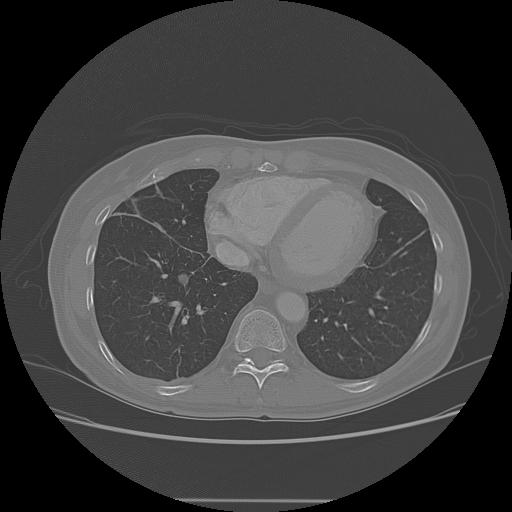

In [199]:
Image.open('/rawdata/yolov5/val/images/LIDC-IDRI-0219_50.jpg')

In [72]:
ls /rawdata/yolov5/val/labels

LIDC-IDRI-0021_100.txt  LIDC-IDRI-0379_8.txt    LIDC-IDRI-0803_225.txt
LIDC-IDRI-0021_113.txt  LIDC-IDRI-0379_83.txt   LIDC-IDRI-0803_28.txt
LIDC-IDRI-0021_124.txt  LIDC-IDRI-0419_146.txt  LIDC-IDRI-0803_37.txt
LIDC-IDRI-0021_125.txt  LIDC-IDRI-0419_149.txt  LIDC-IDRI-0803_97.txt
LIDC-IDRI-0021_126.txt  LIDC-IDRI-0419_150.txt  LIDC-IDRI-0929_115.txt
LIDC-IDRI-0021_127.txt  LIDC-IDRI-0419_151.txt  LIDC-IDRI-0929_15.txt
LIDC-IDRI-0021_128.txt  LIDC-IDRI-0419_152.txt  LIDC-IDRI-0929_174.txt
LIDC-IDRI-0021_129.txt  LIDC-IDRI-0419_153.txt  LIDC-IDRI-0929_222.txt
LIDC-IDRI-0021_130.txt  LIDC-IDRI-0419_172.txt  LIDC-IDRI-0929_28.txt
LIDC-IDRI-0021_138.txt  LIDC-IDRI-0419_180.txt  LIDC-IDRI-0929_75.txt
LIDC-IDRI-0021_2.txt    LIDC-IDRI-0419_23.txt   LIDC-IDRI-0929_76.txt
LIDC-IDRI-0021_34.txt   LIDC-IDRI-0419_24.txt   LIDC-IDRI-0929_77.txt
LIDC-IDRI-0021_64.txt   LIDC-IDRI-0423_15.txt   LIDC-IDRI-0929_78.txt
LIDC-IDRI-0021_8.txt    LIDC-IDRI-0423_165.txt  LIDC-IDRI-0929_79.txt
LIDC-IDRI-0089_0

In [70]:
ls /rawdata/yolov5/val/images/LIDC-IDRI-0423_170.jpg

/rawdata/yolov5/val/images/LIDC-IDRI-0423_170.jpg


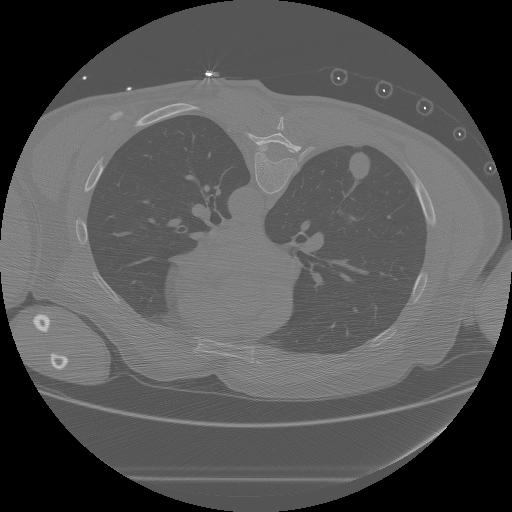

In [71]:
Image.open('/rawdata/yolov5/val/images/LIDC-IDRI-0423_170.jpg')

In [83]:
ls runs/train/yolov5s_results13/

F1_curve.png                                        results.png
PR_curve.png                                        train_batch0.jpg
P_curve.png                                         train_batch1.jpg
R_curve.png                                         train_batch2.jpg
confusion_matrix.png                                val_batch0_labels.jpg
events.out.tfevents.1636441086.bfd6ffe357ab.4008.0  val_batch0_pred.jpg
hyp.yaml                                            val_batch1_labels.jpg
labels.jpg                                          val_batch1_pred.jpg
labels_correlogram.jpg                              val_batch2_labels.jpg
opt.yaml                                            val_batch2_pred.jpg
results.csv                                         weights/


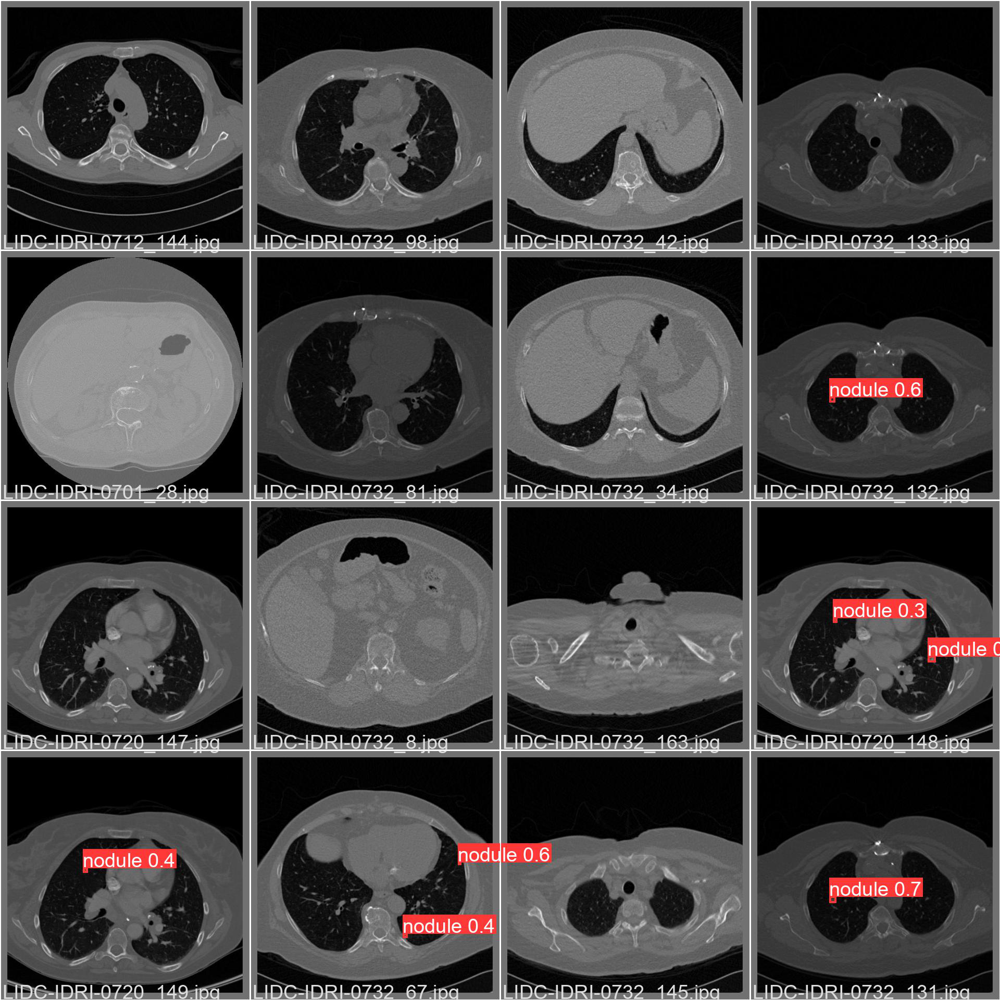

In [456]:
Image.open('runs/train/yolov5s_results18/val_batch2_pred.jpg')

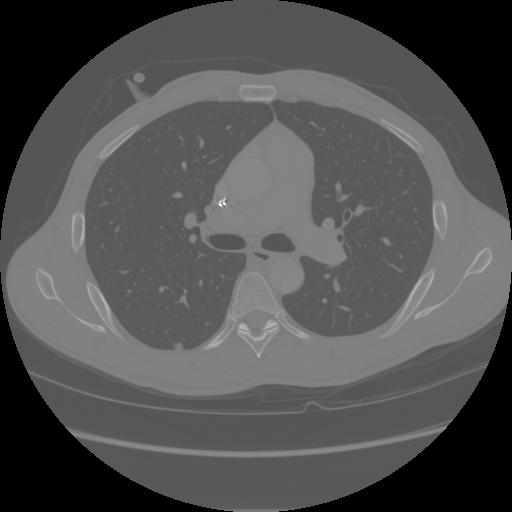

In [87]:
Image.open('/data/yolov5/train/images/LIDC-IDRI-0068_158.jpg')

### Test prediction on one image

In [457]:
!python detect.py --weights runs/train/yolov5s_results18/weights/best.pt --img 512 --conf 0.4 --source /app/data/yolov5/train/images/LIDC-IDRI-0001_0_87.jpg

detect: weights=['runs/train/yolov5s_results18/weights/best.pt'], source=/app/data/yolov5/train/images/LIDC-IDRI-0001_0_87.jpg, imgsz=[512, 512], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-43-g19c8760 torch 1.10.0a0+3fd9dcf CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients, 16.8 GFLOPs
image 1/1 /app/data/yolov5/train/images/LIDC-IDRI-0001_0_87.jpg: 512x512 1 nodule, Done. (0.013s)
Speed: 0.5ms pre-process, 12.5ms inference, 1.8ms NMS per image at shape (1, 3, 512, 512)
Results saved to runs/detect/exp17


In [459]:
ls runs/detect/exp17

LIDC-IDRI-0001_0_87.jpg


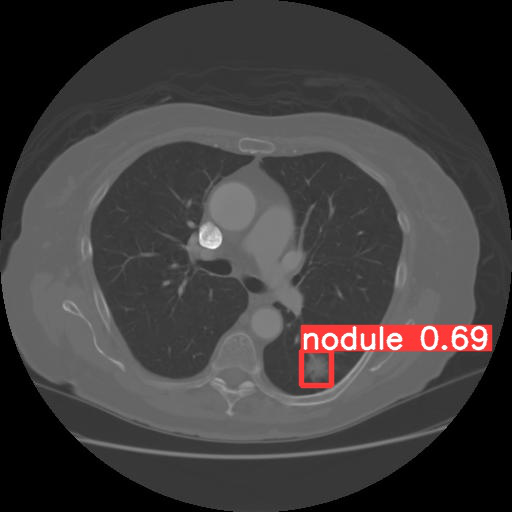

In [460]:
Image.open('runs/detect/exp17/LIDC-IDRI-0001_0_87.jpg')

In [116]:
!python detect.py --weights runs/train/yolov5s_results3/weights/best.pt --img 512 --conf 0.4 --source /data/yolov5/train/images/LIDC-IDRI-0007_120.jpg

detect: weights=['runs/train/yolov5s_results3/weights/best.pt'], source=/data/yolov5/train/images/LIDC-IDRI-0007_120.jpg, imgsz=[512, 512], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-43-g19c8760 torch 1.10.0a0+3fd9dcf CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients, 16.8 GFLOPs
image 1/1 /data/yolov5/train/images/LIDC-IDRI-0007_120.jpg: 512x512 Done. (0.012s)
Speed: 0.4ms pre-process, 11.7ms inference, 0.3ms NMS per image at shape (1, 3, 512, 512)
Results saved to runs/detect/exp15


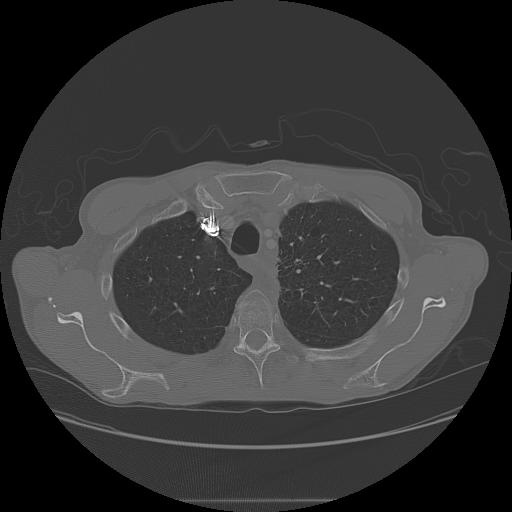

In [118]:
Image.open('runs/detect/exp15/LIDC-IDRI-0007_120.jpg')

### Testing

In [35]:
testdir = '/app/yolov5/test'

In [149]:
import os, shutil
import glob
from tqdm import tqdm

def removedir(dirname):
    print("Directory {} exists, removing!".format(dirname))
    files = glob.glob(dirname + "/*")
    for i in tqdm(range(len(files))):
        if os.path.isdir(files[i]):
            shutil.rmtree(files[i])
            

def save_patient_image_and_bbox(patient_id, root_dir='/app/yolov5/test'):
    
    # create the directories
    imagedirname = None
    labeldirname = None
    dirname = patient_id#.replace('-','_')
    patientdir = root_dir + "/" + dirname
    imagedirname = patientdir + "/" + 'images'
    labeldirname = patientdir + "/" + 'labels'
     
    #clean up any previous data for this patient
    if os.path.exists(patientdir):
        removedir(patientdir)

    print("Creating directory {}".format(imagedirname))
    os.makedirs(imagedirname)

    print("Creating directory {}".format(labeldirname))
    os.makedirs(labeldirname)
            
    # query the image data from the CT volume
    print("Reading data for patient {}".format(patient_id))
    scan = pl.query(pl.Scan).filter(pl.Scan.patient_id.in_([patient_id]))[0]
    nodules_annotation = scan.cluster_annotations()
    with contextlib.redirect_stdout(None):
        vol = scan.to_volume()

    cmask_CT = []
    cbbox_CT = []
    masks_CT = []
    for nodule_idx, nodule in enumerate(nodules_annotation):
        cmask, cbbox, masks = consensus(nodule)
        cmask_CT.append(cmask)
        cbbox_CT.append(cbbox)
        masks_CT.append(masks)
    CT_mask = np.zeros_like(vol)    
    nodule_num = len(cmask_CT)
    print("Number of nodules for patient {} is {}".format(patient_id, nodule_num))
    
    # save the image, even if it does not have any nodules, this will be used for predictions
    if nodule_num <= 0: # no nodules
        num_slices = vol.shape[2]
        im = vol[:,:,int(num_slices/2)]
        image_filename = "{}_{}.jpg".format(patient_id, int(num_slices/2))
        print("Saving image to file {}".format(imagedirname + "/" + image_filename))
        imageio.imwrite(imagedirname + "/" + image_filename, im)
    else: # when there are nodules present
        for i in range(nodule_num):
            cmask = cmask_CT[i]
            cbbox = cbbox_CT[i]
            masks = masks_CT[i]
            CT_mask[cbbox] += cmask
            img_count = 0
            for k_slice in np.arange(cbbox[2].start, cbbox[2].stop):
                im = vol[:,:,k_slice]
                msk = CT_mask[:,:,k_slice]
                x,y,w,h = get_bounding_box(msk)
                if x is not None:
                    image_filename = "{}_{}_{}.jpg".format(patient_id, i, k_slice)
                    
                    noduledir = imagedirname + "/" + str(i)
                    if not os.path.exists(noduledir):
                        os.makedirs(noduledir)
                    imageio.imwrite(noduledir + "/" + image_filename, im)
                    c = 0
                    label = "{} {} {} {} {}".format(c, x, y, w, h)
                    label_filename = "{}_{}_{}.txt".format(patient_id, i, k_slice)
                    labeldir = labeldirname + "/" + str(i)
                    if not os.path.exists(labeldir):
                        os.makedirs(labeldir)
                    f = open(labeldir + "/" + label_filename, "a")
                    f.write(label)
                    f.close()
                    img_count += 1
            print("Saved {} images for nodule {} of patient {}".format(img_count, i, patient_id))
    return nodule_num

For a given patient, generate the images for each nodule and the labels

In [57]:
# nodule_num = save_patient_image_and_bbox('LIDC-IDRI-0001', testdir)

In [58]:
model_weights = '/app/yolov5/runs/train/yolov5s_results3/weights/best.pt'

In [59]:
# import re

# source_dir = '/app/yolov5/test/LIDC-IDRI-0001/images/0'
# temp_dir = '/app/yolov5/temp'
# if not os.path.exists(temp_dir):
#     os.makedirs(temp_dir)
# temp_file = temp_dir + "/" + 'temp.txt'
# predict_command = "python detect.py --weights {} --img 512 --conf 0.4 --source {} > {}".format(model_weights, source_dir, temp_file)
# exit_code = os.system(predict_command)

# with open('/app/yolov5/temp/temp.txt') as f:
#     line = f.read()
#     rc = re.compile(r'Results saved to (.*)')
#     m = rc.search(line)
# print("Number of matches is {}".format(len(m.groups())))
# ansi_escape = re.compile(r'\x1B(?:[@-Z\\-_]|\[[0-?]*[ -/]*[@-~])')
# result = ansi_escape.sub('', m[1])
# print("Saved to path {}".format(result))
# print("Program exited with {}".format(exit_code))

In [60]:
import math
def plot_detections(result_dir='/app/yolov5/runs/detect/exp14'):
    images = os.listdir(result_dir)
    num_images_row = 3
    print("Number of images {}".format(len(images)))
    if len(images) > num_images_row: # need rows more than one
        num_rows = math.ceil(len(images)/num_images_row)
        f, a = plt.subplots(num_rows, 3, figsize=(14, 15))
    c = 0
    for idx, img in enumerate(images):
        img = Image.open(result_dir + "/" + img)
        if c > num_images_row-1:
            c = 0
        a[int(idx/num_images_row)][c].imshow(np.array(img))
        c += 1
    if c < num_images_row:
        for j in list(range(num_images_row,c,-1)):
            a.flat[-(num_images_row-j+1)].set_visible(False)
    plt.show()

#### Routine to predict nodules

Input: 
- patient id -> enter the patient id
- testdir -> the dir where the images for the patient are extracted an placed
- nodule_num -> the number of nodules as per ground truth in the patient

In [61]:
root_dir = '/app/yolov5'

In [62]:
import re
import subprocess
def predict_nodules(patient_id, testdir, nodule_num, root_dir):
    predicted_paths = []
    for nodule in range(nodule_num):
        source_dir = testdir + "/" + str(patient_id) + "/images/" + str(nodule)
        temp_dir = root_dir + '/temp'
        if not os.path.exists(temp_dir):
            os.makedirs(temp_dir)
        temp_file = temp_dir + "/" + 'temp.txt'
        print("Reading data from {}".format(source_dir))
        predict_command = "python detect.py --weights {} --img 512 --conf 0.25 --source {} 2>&1 | tee {}".format(model_weights, source_dir, temp_file)
        print("Running command:\n")
        print(predict_command)
        ret_code = os.system(predict_command)
        print("Command executed with code {}".format(ret_code))
        print("Scanning output file {}".format(temp_file))
        with open(temp_file) as f:
            line = f.read()
            rc = re.compile(r'Results saved to (.*)')
            m = rc.search(line)
            if (m is not None) and (len(m.groups())>=1):
                ansi_escape = re.compile(r'\x1B(?:[@-Z\\-_]|\[[0-?]*[ -/]*[@-~])')
                result = ansi_escape.sub('', m[1])
                print("Predicted and saved the results to {}/{}".format('/app/yolov5', result))
            else:
                print("Could not save the predictions!")
            predicted_paths.append(root_dir + "/" + result)
    return predicted_paths

### Test pipeline for a patient

- For a patient id, extract the images and the ground truth bounding box coordinates and save them in one directory, one directory per nodule
- Run the prediction using the bext weights and save the results
- Plot the predictions and compare with the actual images and the ground truth bounding box

In [63]:
testdir = root_dir + '/test/'
patient_id = 'LIDC-IDRI-0001'
nodule_num = save_patient_image_and_bbox(patient_id, testdir)
print("Found {} nodules in patient {}".format(nodule_num, patient_id))
predicted_paths = predict_nodules(patient_id, testdir, nodule_num, root_dir)
print("Found a total of {} nodules".format(len(predicted_paths)))

Directory /app/yolov5/test//LIDC-IDRI-0001 exists, removing!


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 72.09it/s]

Creating directory /app/yolov5/test//LIDC-IDRI-0001/images
Creating directory /app/yolov5/test//LIDC-IDRI-0001/labels
Reading data for patient LIDC-IDRI-0001



Lossy conversion from int16 to uint8. Range [-2048, 3038]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-2048, 2884]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-2048, 3071]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-2048, 3071]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-2048, 3071]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-2048, 3071]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-2048, 3071]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-2048, 3071]. Convert image to uint8 prior to saving to suppress this warning.


Number of nodules for patient LIDC-IDRI-0001 is 1
Saved 8 images for nodule 0 of patient LIDC-IDRI-0001
Found 1 nodules in patient LIDC-IDRI-0001
Reading data from /app/yolov5/test//LIDC-IDRI-0001/images/0
Running command:

python detect.py --weights /app/yolov5/runs/train/yolov5s_results3/weights/best.pt --img 512 --conf 0.25 --source /app/yolov5/test//LIDC-IDRI-0001/images/0 2>&1 | tee /app/yolov5/temp/temp.txt
detect: weights=['/app/yolov5/runs/train/yolov5s_results3/weights/best.pt'], source=/app/yolov5/test//LIDC-IDRI-0001/images/0, imgsz=[512, 512], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-43-g19c8760 torch 1.10.0a0+3fd9dcf CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
M

Number of images 8


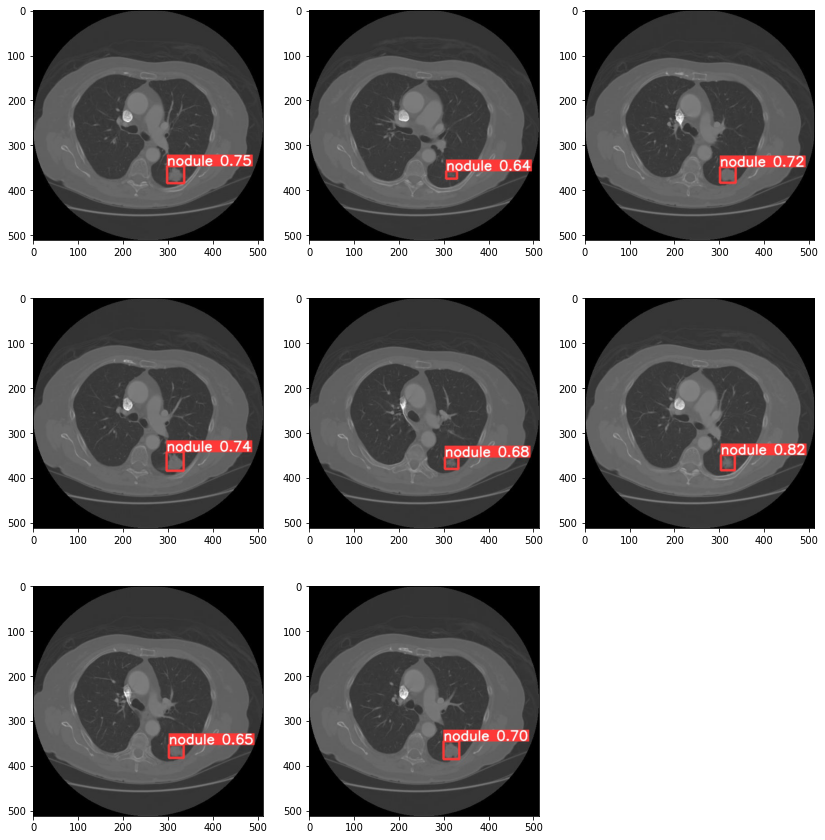

In [64]:
plot_detections(predicted_paths[0])

#### Plot and compare the predicted bounding box vs the actual bounding box

In [65]:
import matplotlib.patches as patches
def plot_and_compare(predicted_paths, patient_id, nodule_num, test_root_dir=testdir):
    
    #get the directories
    imagedirname = None
    labeldirname = None
    dirname = patient_id#.replace('-','_')
    patientdir = test_root_dir + "/" + dirname
    imagedirname = patientdir + "/" + 'images'
    labeldirname = patientdir + "/" + 'labels'
    
    
    images = os.listdir(predicted_paths[nodule_num])
    labeldir = labeldirname + "/" + str(nodule_num)
    print("Loading labels from {}".format(labeldir))
    labels = os.listdir(labeldir)
    
    imagedir = imagedirname + "/" + str(nodule_num)
    source_images = os.listdir(imagedir)
    
    num_images_row = 1
    print("Number of images {}".format(len(images)))
    if len(images) > num_images_row: # need rows more than one
        num_rows = math.ceil(len(images)/num_images_row)
        f, a = plt.subplots(num_rows, num_images_row*2, figsize=(14, 35))
    c = 0
    for idx, (imgstr, src_imgstr) in enumerate(zip(images, source_images)):
        img = Image.open(predicted_paths[nodule_num] + "/" + imgstr)
        src_img = Image.open(imagedir + "/" + src_imgstr)
        if c > num_images_row-1:
            c = 0
        a[int(idx/num_images_row)][c].imshow(np.array(img))
        a[int(idx/num_images_row)][c+1].imshow(np.array(src_img))
        src_labelstr = src_imgstr.replace('.jpg','.txt')
        
        with open(labeldir + "/" + src_labelstr) as f:
            line = f.read()
            cls, x, y, w, h = line.split(' ')
            x, y, w, h = float(x), float(y), float(w), float(h)
            rect = patches.Rectangle((x, y), (w), (h), linewidth=1, edgecolor='r', facecolor='none')
            a[int(idx/num_images_row)][c+1].add_patch(rect)
            
        c += 1
    if c < num_images_row:
        for j in list(range(num_images_row,c,-1)):
            a.flat[-(num_images_row-j+1)].set_visible(False)
    plt.show()

Loading labels from /app/yolov5/test/LIDC-IDRI-0001/labels/0
Number of images 8


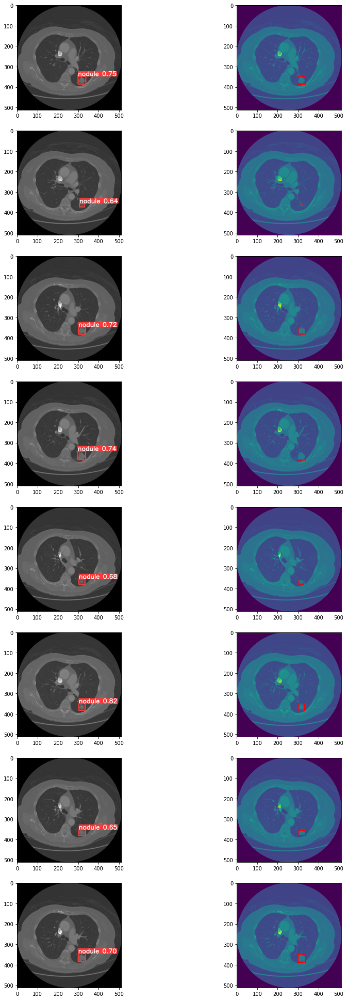

In [66]:
plot_and_compare(predicted_paths, 'LIDC-IDRI-0001', 0, '/app/yolov5/test')

### Load the saved segmentation model

In [3]:
import pylidc as pl
from pylidc.utils import consensus
import pydicom as dicom
from skimage.measure import find_contours
import numpy as np
import matplotlib.pyplot as plt
import os
from numpy import random
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchsummary import summary
from torch.utils.data import Dataset, DataLoader
import torchvision
import time
from torch.nn.parallel import DistributedDataParallel as DDP

In [4]:
class Block(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding = 1)
        self.relu1 = nn.ReLU()
        self.bn1   = nn.BatchNorm2d(out_ch)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding = 1)
        self.relu2 = nn.ReLU()
        self.bn2   = nn.BatchNorm2d(out_ch)
    
    def forward(self, x):
        return self.bn2(self.relu2(self.conv2(self.bn1(self.relu1(self.conv1(x))))))
    

class Encoder(nn.Module):
    def __init__(self, chs=(1,32,64,128,256)):
        super().__init__()
        self.enc_blocks = nn.ModuleList([Block(chs[i], chs[i+1]) for i in range(len(chs)-1)])
        self.pool       = nn.MaxPool2d(2)
    
    def forward(self, x):
        ftrs = []
        for block in self.enc_blocks:
            x = block(x)
            ftrs.append(x)
            x = self.pool(x)
        return ftrs


class Decoder(nn.Module):
    def __init__(self, chs=(256, 128, 64, 32)):
        super().__init__()
        self.chs         = chs
        self.upconvs    = nn.ModuleList([nn.ConvTranspose2d(chs[i], chs[i+1], 2, 2) for i in range(len(chs)-1)])
        self.dec_blocks = nn.ModuleList([Block(chs[i], chs[i+1]) for i in range(len(chs)-1)]) 
        
    def forward(self, x, encoder_features):
        for i in range(len(self.chs)-1):
            x        = self.upconvs[i](x)
#            enc_ftrs = self.crop(encoder_features[i], x)
#            x        = torch.cat([x, enc_ftrs], dim=1)
            x        = torch.cat([x, encoder_features[i]], dim=1)
            x        = self.dec_blocks[i](x)
        return x
    
#    def crop(self, enc_ftrs, x):
#        _, _, H, W = x.shape
#        enc_ftrs   = torchvision.transforms.CenterCrop([H, W])(enc_ftrs)
#        return enc_ftrs
    


class Unet(nn.Module):
    def __init__(self, enc_chs=(1,32,64,128,256), dec_chs=(256, 128, 64, 32), num_class=1, retain_dim=False, out_sz=(512,512)):
        super().__init__()
        self.encoder     = Encoder(enc_chs)
        self.decoder     = Decoder(dec_chs)
        self.head        = nn.Conv2d(dec_chs[-1], num_class, 1)
        self.retain_dim  = retain_dim

    def forward(self, x):
        enc_ftrs = self.encoder(x)
        out      = self.decoder(enc_ftrs[::-1][0], enc_ftrs[::-1][1:])
        out      = self.head(out)
        if self.retain_dim:
            out = F.interpolate(out, out_sz)
        return out

In [5]:
print(torch.__version__)
print("Number of GPUs =", torch.cuda.device_count())

1.10.0a0+3fd9dcf
Number of GPUs = 1


In [6]:
seg_model = Unet()
seg_model = torch.nn.parallel.DataParallel(seg_model, device_ids=[0]).cuda()

In [7]:
seg_model.load_state_dict(torch.load('/app/saved_model/Epoch24.pth'))
seg_model.eval()

DataParallel(
  (module): Unet(
    (encoder): Encoder(
      (enc_blocks): ModuleList(
        (0): Block(
          (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (relu1): ReLU()
          (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (relu2): ReLU()
          (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): Block(
          (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (relu1): ReLU()
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (relu2): ReLU()
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (2): Block(
 

In [8]:
summary(seg_model, (1,512,512))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 512, 512]             320
              ReLU-2         [-1, 32, 512, 512]               0
       BatchNorm2d-3         [-1, 32, 512, 512]              64
            Conv2d-4         [-1, 32, 512, 512]           9,248
              ReLU-5         [-1, 32, 512, 512]               0
       BatchNorm2d-6         [-1, 32, 512, 512]              64
             Block-7         [-1, 32, 512, 512]               0
         MaxPool2d-8         [-1, 32, 256, 256]               0
            Conv2d-9         [-1, 64, 256, 256]          18,496
             ReLU-10         [-1, 64, 256, 256]               0
      BatchNorm2d-11         [-1, 64, 256, 256]             128
           Conv2d-12         [-1, 64, 256, 256]          36,928
             ReLU-13         [-1, 64, 256, 256]               0
      BatchNorm2d-14         [-1, 64, 2

In [73]:
predicted_paths

['/app/yolov5/runs/detect/exp12']

In [9]:
# nodule_num = 0
# test_root_dir = '/app/yolov5/test/'
# imagedirname = None
# dirname = patient_id#.replace('-','_')
# patientdir = test_root_dir + "/" + dirname
# imagedirname = patientdir + "/" + 'images'
# images = os.listdir(predicted_paths[nodule_num])
# imagedir = imagedirname + "/" + str(nodule_num)
# source_images = os.listdir(imagedir)
# source_images

In [76]:
# nodule_num = 0
# imagedirname = None
# dirname = patient_id#.replace('-','_')
# patientdir = test_root_dir + "/" + dirname
# imagedirname = patientdir + "/" + 'images'
# images = os.listdir(predicted_paths[nodule_num])
# imagedir = imagedirname + "/" + str(nodule_num)
# source_images = os.listdir(imagedir)

# #image = vol[:,:,k_slice].astype('float32')
# #Image.open()
# image -= np.mean(image)
# image /= np.std(image)
# image = torch.from_numpy(image[np.newaxis,np.newaxis,:]).to(device)
# mask_pre = torch.sigmoid(model(image)).detach().cpu().numpy()
# mask_pre = np.squeeze(mask_pre)
# #  print(np.max(mask_pre), np.min(mask_pre))
# #  print(np.max(CT_mask[:,:,k_slice]), np.min(CT_mask[:,:,k_slice]))
# mask_pre = np.where(mask_pre>0.5, 1,0)

In [10]:
device = torch.device("cuda")

In [77]:
ls {yolo_data_dir}/train/images/LIDC-IDRI-0626_74*

/data/yolov5//train/images/LIDC-IDRI-0626_74.jpg


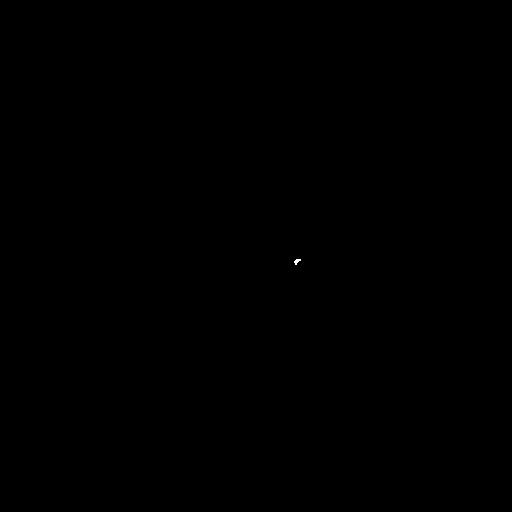

In [92]:
Image.open(yolo_data_dir + '/train/masks/LIDC-IDRI-0007_120.jpg')

In [468]:
image = Image.open(yolo_data_dir + '/train/images/LIDC-IDRI-0007_120.jpg')
image = np.array(image).astype('float32')
image -= np.mean(image)
image /= np.std(image)
image = torch.from_numpy(image[np.newaxis,np.newaxis,:]).to(device)
mask_pre_prob = torch.sigmoid(seg_model(image)).detach().cpu().numpy()
mask_pre_prob = np.squeeze(mask_pre_prob)
mask_pre = np.where(mask_pre_prob>0.5, 1,0)
print(np.unique(mask_pre))

[0 1]


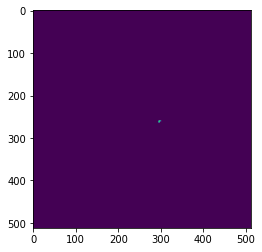

In [469]:
plt.imshow(mask_pre)

[0 1]


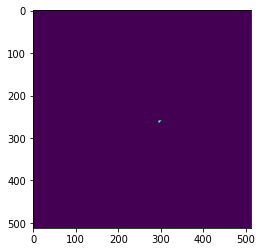

In [470]:
image = Image.open(yolo_data_dir + '/train/masks/LIDC-IDRI-0007_120.jpg')
image = image.convert('1')
image = np.array(image)
image = image.astype(np.uint8)
plt.imshow(image)
print(np.unique(image))

In [471]:
print("Image shape= {}, predicted shape = {}".format(image.shape, mask_pre.shape))

Image shape= (512, 512), predicted shape = (512, 512)


In [52]:
a1 = np.array([[0,0,0,0,0,1,0,1,0],[0,1,0,1,0,1,0,0,0]])
a2 = np.array([[0,0,0,0,0,0,0,1,1],[0,0,0,1,0,1,0,1,0]])

In [547]:
dice_coef(a1, a2)

0.6000039999600004

In [500]:
at1 = torch.from_numpy(a1)
at2 = torch.from_numpy(a2)

In [503]:
torch.sum(at1, dim=1)

tensor([1, 0])

In [506]:
torch.sum(at1 * at2, dim=1)

tensor([1, 0])

In [508]:
torch.sum(at1)

tensor(1)

In [509]:
torch.sum(at2)

tensor(2)

In [58]:
a1 = np.array([[0,0,0,0,0,1,0,0,0],[0,0,0,1,0,1,0,0,0]])
a2 = np.array([[0,0,0,0,0,1,0,0,0],[0,0,0,0,0,0,0,1,1]])
at1 = torch.from_numpy(a1)
at2 = torch.from_numpy(a2)
smooth = 0.0001
torch.mean( (2. * torch.sum(at1 * at2, dim=1) + smooth) / (torch.sum(at1, dim=1) + torch.sum(at2, dim=1) + smooth) )

tensor(0.5000)

In [11]:
def iou_coef(y_true, y_pred):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = (y_true_f * y_pred_f).sum()
    smooth = 0.0001
    return (2. * intersection + smooth) / ((y_true_f).sum() + (y_pred_f).sum() - intersection + smooth)

In [12]:
def dice_coef(y_true, y_pred):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = (y_true_f * y_pred_f).sum()
    smooth = 0.0001
    return (2. * intersection + smooth) / ((y_true_f).sum() + (y_pred_f).sum() + smooth)

In [13]:
def torch_dice_coeff(y_true, y_pred):
    smooth = 0.0001
    return torch.mean( (2. * torch.sum(y_true * y_pred, dim=1) + smooth) / (torch.sum(y_true, dim=1) + torch.sum(y_pred, dim=1) + smooth) )

In [160]:
def torch_dice_coeff_2(y_true, y_pred):
    smooth = 0.0001
    #return torch.mean( (2. * torch.sum(y_true * y_pred, dim=1) + smooth) / (torch.sum(y_true, dim=1) + torch.sum(y_pred, dim=1) + smooth) )
    return torch.mean((2. *torch.sum(y_true * y_pred, dim = [1,2]) + smooth)/(torch.sum(y_true, dim=[1,2]) + torch.sum(y_pred, dim=[1,2]) + smooth), dim=[0])

In [231]:
# DICE only for the images which has nodules in ground truth
def torch_dice_coeff_3(y_true, y_pred):
    smooth = 0.0001
    true_nodules = torch.sum(y_true, dim=[1,2])
    idxs = torch.where(true_nodules>0)
    y_true = y_true[idxs]
    y_pred = y_pred[idxs]
    if idxs[0].shape[0] <=0:
        return torch.tensor(0.0)
    else:
    #return torch.mean( (2. * torch.sum(y_true * y_pred, dim=1) + smooth) / (torch.sum(y_true, dim=1) + torch.sum(y_pred, dim=1) + smooth) )
        return torch.mean((2. *torch.sum(y_true * y_pred, dim = [1,2]) + smooth)/(torch.sum(y_true, dim=[1,2]) + torch.sum(y_pred, dim=[1,2]) + smooth), dim=[0])

In [213]:
true_nodules = torch.sum(y_true, dim=[1,2])
idxs = torch.where(true_nodules>0)

In [229]:
torch_dice_coeff_3(y_true, y_pred)

tensor(0.3962)

In [227]:
idxs[0].shape[0]

2

In [110]:
def torch_iou_coef(y_true, y_pred):
    smooth = 0.0001
    intersection = torch.sum(torch.abs(y_true * y_pred), dim=1)
    union = torch.sum(y_true,dim=1)+ torch.sum(y_pred,dim=1)-intersection
    iou = torch.mean((intersection + smooth) / (union + smooth),)
    return iou

In [80]:
print(np.squeeze(least_label).detach().cpu().shape)
print(least_pre.shape)
y_true = np.squeeze(least_label).detach().cpu()
y_pred = least_pre

torch.Size([12, 512, 512])
torch.Size([12, 512, 512])


In [124]:
i = torch.sum(y_true * y_pred)
i

tensor(21)

In [127]:
(y_true * y_pred).shape

torch.Size([12, 512, 512])

In [159]:
(2. * torch.sum(y_true * y_pred, dim = [1,2]) + 0.0001)/(torch.sum(y_true, dim=[1,2]) + torch.sum(y_pred, dim=[1,2]) + 0.0001)

tensor([1.0000e+00, 7.9245e-01, 1.0000e+00, 4.8077e-07, 2.7174e-07, 1.0000e+00,
        1.0000e+00, 1.0000e+00, 1.0000e+00, 1.0000e+00, 1.0000e+00, 1.0000e+00])

In [158]:
torch.mean((2*torch.sum(y_true * y_pred, dim = [1,2]) + 0.0001)/(torch.sum(y_true, dim=[1,2]) + torch.sum(y_pred, dim=[1,2]) + 0.0001), dim=[0])

tensor(0.8160)

In [148]:
torch.sum(y_true, dim=[1,2])

tensor([  0,  32,   0, 208,   0,   0,   0,   0,   0,   0,   0,   0])

In [149]:
torch.sum(y_pred, dim=[1,2])

tensor([  0,  21,   0,   0, 368,   0,   0,   0,   0,   0,   0,   0])

In [99]:
u = torch.sum(y_true, dim=1) + torch.sum(y_pred, dim=1)
u.shape

torch.Size([12, 512])

In [109]:
v = (2*i + 0.0001)/(u + 0.0001)
print(v.shape)
torch.mean(v)

torch.Size([12, 512])


tensor(0.9915)

In [107]:
intersection = torch.sum(torch.abs(y_true * y_pred), dim=[1])#.shape
union = torch.sum(y_true,dim=1)+ torch.sum(y_pred,dim=1)-intersection
torch.mean((intersection + 0.0001)/(union + 0.0001))

tensor(0.9914)

In [554]:
timage = torch.from_numpy(image)
tmask_pre_prob = torch.from_numpy(mask_pre_prob)
torch_dice_coeff(timage, tmask_pre_prob)

tensor(0.8381)

In [555]:
dice_coef(image, mask_pre_prob)

0.6197107235302441

In [190]:
np.unique(mask_pre)

array([0, 1])

In [18]:
image_files = os.listdir('/rawdata/all/train/images/')
mask_files = os.listdir('/rawdata/all/train/masks/')
print("{} image files and {} masks".format(len(image_files), len(mask_files)))

220892 image files and 220889 masks


In [16]:
image_files[:5]

['img_LIDC-IDRI-0142_207.jpg',
 'img_LIDC-IDRI-0784_106.jpg',
 'img_LIDC-IDRI-0465_113.jpg',
 'img_LIDC-IDRI-0117_46.jpg',
 'img_LIDC-IDRI-0333_237.jpg']

In [17]:
mask_files[:5]

['mask_LIDC-IDRI-0781_128.jpg',
 'mask_LIDC-IDRI-0973_40.jpg',
 'mask_LIDC-IDRI-0951_219.jpg',
 'mask_LIDC-IDRI-0333_74.jpg',
 'mask_LIDC-IDRI-0837_228.jpg']

#### Create the train and test split

In [174]:
val_ratio = 0.2
SEED = 2021
random.seed(SEED)
num_files = len(image_files)
idxs = np.arange(num_files)
random.shuffle(idxs)
train_image_files = np.array(image_files)[idxs][:int(num_files*(1-val_ratio))]
train_mask_files = [fn.replace('img','mask') for fn in train_image_files]

val_image_files = np.array(image_files)[idxs][int(num_files*(1-val_ratio)):]
val_mask_files = [fn.replace('img','mask') for fn in val_image_files]

num_tr_files = len(train_image_files)
num_val_files = len(val_image_files)
frac = 1.0
train_image_files = train_image_files[:int(num_tr_files*frac)]
train_mask_files = train_mask_files[:int(num_tr_files*frac)]

val_image_files = val_image_files[:int(num_val_files*frac)]
val_mask_files = val_mask_files[:int(num_val_files*frac)]

In [175]:
len(val_image_files)

44179

In [313]:
ls /data/yolov5/train/images/LIDC-IDRI-0007*

/data/yolov5/train/images/LIDC-IDRI-0007_0.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_1.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_10.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_100.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_101.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_102.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_103.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_104.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_105.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_106.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_107.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_108.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_109.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_11.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_110.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_111.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_112.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_113.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_114.jpg
/data/yolov5/train/images/LIDC-IDRI-0007_115.jpg
/data/yolov5/train/images/

In [170]:
from PIL import Image
class nodule_data(Dataset):
    def __init__(self,image_paths,mask_paths):
        super().__init__()
        self.image_paths = image_paths
        self.mask_paths  = mask_paths
        
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, index):
        
#         image = np.load('/data/all/train/images/' + self.image_paths[index])['arr_0'].astype('float32')
#         mask  = np.load('/data/all/train/masks/' + self.mask_paths[index])['arr_0'].astype('float32')
        try:
            image = Image.open('/rawdata/all/train/images/' + self.image_paths[index])
            mask = Image.open('/rawdata/all/train/masks/' + self.mask_paths[index])
            mask = mask.convert('1')
            mask = np.array(mask)
            mask = mask.astype(np.uint8)
            image -= np.mean(image)
            image /= np.std(image)
        except:
            #issues loading image, return blank image and mask
            print("Found an issue with image {}".format(self.image_paths[index]))
            image = np.zeros([512, 512])
            mask = np.zeros([512, 512])
            mask = mask.astype(np.uint8)
            image -= np.mean(image)
            image /= np.std(image)
        return image[np.newaxis,:].astype('float32'), mask[np.newaxis,:]#, self.image_paths[index], self.mask_paths[index]
            

batch_size = 12
num_workers = 4
nodule_data_val = nodule_data(val_image_files, val_mask_files)
val_loader = DataLoader(nodule_data_val, batch_size = batch_size,
                             num_workers = num_workers)

In [169]:
dataiter = iter(val_loader)
images,labels = dataiter.next()
print(images.dtype, labels.dtype)

torch.float32 torch.uint8


In [43]:
print(images.shape, labels.shape)

torch.Size([12, 1, 512, 512]) torch.Size([12, 1, 512, 512])


In [48]:
with torch.no_grad():
    mask_pre_prob = torch.sigmoid(seg_model(images.to(device)))#.detach().cpu().numpy()
    #outputs = seg_model(images.to(device))
    labels = labels.to(device)
#     loss = criterion(outputs, labels.float())
#     running_loss += loss.item()
    outputs = np.squeeze(mask_pre_prob).detach().cpu()
    mask_pre = np.where(outputs>0.5, 1,0)
    
    #score = dice_coef(outputs, labels)
    #score = dice_coef(np.squeeze(labels).detach().cpu(), mask_pre)
    #labels = torch.from_numpy(labels)
    mask_pre = torch.from_numpy(mask_pre)
    score = torch_dice_coeff(np.squeeze(labels).detach().cpu(), mask_pre)
    images, labels = dataiter.next()

In [49]:
score

tensor(0.9992)

In [233]:
from tqdm import tqdm
def calculate_dice_score_eval():
    batch_dice_score = []
    least_dice = 1
    least_label = None
    least_pre = None
    with torch.no_grad():
        for i, data in tqdm(enumerate(val_loader)):
            inputs, labels = data[0].to(device), data[1].to(device)
            mask_pre_prob = torch.sigmoid(seg_model(inputs))#.detach().cpu().numpy()
            outputs = np.squeeze(mask_pre_prob).detach().cpu()
            mask_pre = np.where(outputs>0.5, 1,0)
            mask_pre = torch.from_numpy(mask_pre)
            score = torch_dice_coeff_3(np.squeeze(labels).detach().cpu(), mask_pre)
            if score < least_dice:
                least_dice = score
                least_label = labels
                least_pre = mask_pre
            batch_dice_score.append(score)
            if (i % 100) == 0:
                print("Accumulated dice coeff {}".format(torch.mean(torch.from_numpy(np.array(batch_dice_score)))))
    final_score = torch.mean(torch.from_numpy(np.array(batch_dice_score)))
    print("dice score: {}".format(final_score))
    return final_score, least_dice, least_label, least_pre

In [ ]:
final_score, least_dice, least_label, least_pre = calculate_dice_score_eval()

1it [00:00,  1.88it/s]

Accumulated dice coeff 0.0


101it [00:34,  2.89it/s]

Accumulated dice coeff 0.3464101552963257


201it [01:09,  2.89it/s]

Accumulated dice coeff 0.307162880897522


301it [01:44,  2.86it/s]

Accumulated dice coeff 0.30004552006721497


401it [02:19,  2.84it/s]

Accumulated dice coeff 0.31045234203338623


501it [02:54,  2.81it/s]

Accumulated dice coeff 0.30906322598457336


601it [03:30,  2.78it/s]

Accumulated dice coeff 0.3293019235134125


701it [04:06,  2.78it/s]

Accumulated dice coeff 0.32088184356689453


801it [04:42,  2.78it/s]

Accumulated dice coeff 0.3242153227329254


901it [05:18,  2.75it/s]

Accumulated dice coeff 0.3233109414577484


1001it [05:54,  2.77it/s]

Accumulated dice coeff 0.31953611969947815


1101it [06:30,  2.77it/s]

Accumulated dice coeff 0.3181644678115845


1201it [07:06,  2.77it/s]

Accumulated dice coeff 0.31946101784706116


1301it [07:42,  2.78it/s]

Accumulated dice coeff 0.3188101351261139


1401it [08:17,  2.76it/s]

Accumulated dice coeff 0.32175979018211365


1501it [08:53,  2.77it/s]

Accumulated dice coeff 0.3207550346851349


1601it [09:30,  2.76it/s]

Accumulated dice coeff 0.3200370967388153


1701it [10:06,  2.76it/s]

Accumulated dice coeff 0.32209548354148865


1801it [10:42,  2.75it/s]

Accumulated dice coeff 0.3254619836807251


1901it [11:18,  2.77it/s]

Accumulated dice coeff 0.32532984018325806


1913it [11:22,  2.77it/s]

In [59]:
least_dice

tensor(0.9915)

In [60]:
final_score

tensor(0.9995)

In [62]:
least_label.shape

torch.Size([12, 1, 512, 512])

In [594]:
least_pre.shape

torch.Size([12, 512, 512])

In [608]:
least_dice

tensor(0.9774)

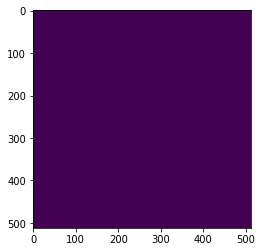

In [65]:
plt.imshow(least_pre[3,:,:])

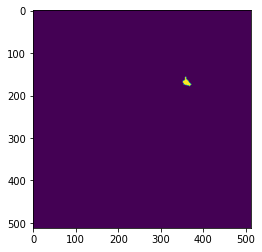

In [67]:
lab = np.squeeze(least_label).detach().cpu()
plt.imshow(lab[3,:,:])

In [162]:
torch_dice_coeff(np.squeeze(least_label).detach().cpu(), least_pre)

tensor(0.9915)

In [163]:
torch_dice_coeff_2(np.squeeze(least_label).detach().cpu(), least_pre)

tensor(0.8160)

In [75]:
least_pre.shape

torch.Size([12, 512, 512])

In [114]:
torch_iou_coef(np.squeeze(least_label).detach().cpu(), least_pre)

tensor(0.9914)

In [63]:
for i in range(least_pre.shape[0]):
    print(np.unique(least_pre[i,:,:]))

[0]
[0 1]
[0]
[0]
[0 1]
[0]
[0]
[0]
[0]
[0]
[0]
[0]


In [64]:
lab = np.squeeze(least_label).detach().cpu()
for i in range(lab.shape[0]):
    print(np.unique(lab[i,:,:]))

[0]
[0 1]
[0]
[0 1]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]


In [599]:
least_pre[0,:,:]

tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]])

In [601]:
lab[0,:,:]

torch.Size([512, 512])

In [111]:
torch_dice_coeff(np.squeeze(least_label).detach().cpu(), least_pre)

tensor(0.9915)

In [612]:
scores_1 = []
for idx in range(least_pre.shape[0]):
    pred = least_pre[idx,:,:]
    true = lab[idx,:,:]
    print(torch_dice_coeff(true, pred))
    scores_1.append(torch_dice_coeff(true, pred))

tensor(0.9570)
tensor(0.9590)
tensor(1.)
tensor(1.)
tensor(0.9316)
tensor(0.9570)
tensor(1.)
tensor(1.)
tensor(0.8984)
tensor(1.)
tensor(0.9883)
tensor(1.)


In [615]:
np.mean([v.item() for v in scores_1])

0.9742841422557831

In [595]:
least_label.shape

torch.Size([12, 1, 512, 512])

In [567]:
torch.mean(torch.from_numpy(np.array(batch_dice_score)))

tensor(0.9991)

#### DICE score for images with nodules

In [261]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
Image.open('/data/yolov5/train/masks/LIDC-IDRI-0034_249.jpg')

UnidentifiedImageError: cannot identify image file '/data/yolov5/train/masks/LIDC-IDRI-0034_249.jpg'

In [255]:
ls /data/yolov5/train/masks/LIDC-IDRI-0034_249.jpg

/data/yolov5/train/masks/LIDC-IDRI-0034_249.jpg


In [240]:
labels.shape

torch.Size([4, 1, 512, 512])

In [237]:
outputs.shape

torch.Size([4, 1, 512, 512])

In [239]:
np.squeeze(outputs).shape

torch.Size([4, 512, 512])

In [228]:
running_score

tensor(0.1037, device='cuda:0')

In [236]:
mask_pre_prob = np.squeeze(outputs.detach().cpu())
mask_pre = np.where(mask_pre_prob>0.5, 1,0)
np.unique(mask_pre)

array([0])

In [242]:
dice_coef(np.squeeze(labels).detach().cpu(), mask_pre)

tensor(1.)

In [128]:
patient_id = 'LIDC-IDRI-0007'
scan = pl.query(pl.Scan).filter(pl.Scan.patient_id.in_([patient_id]))[0]
nodules_annotation = scan.cluster_annotations()
with contextlib.redirect_stdout(None):
    vol = scan.to_volume()
vol.shape

(512, 512, 145)

In [129]:
# save all the masks
cmask_CT = []
cbbox_CT = []
masks_CT = []
for nodule_idx, nodule in enumerate(nodules_annotation):
    cmask, cbbox, masks = consensus(nodule)
    cmask_CT.append(cmask)
    cbbox_CT.append(cbbox)
    masks_CT.append(masks)
CT_mask = np.zeros_like(vol)    
nodule_num = len(cmask_CT)
print(nodule_num)

2


In [130]:
for i in range(nodule_num):
    cmask = cmask_CT[i]
    cbbox = cbbox_CT[i]
    masks = masks_CT[i]
    CT_mask[cbbox] += cmask

[0 1]


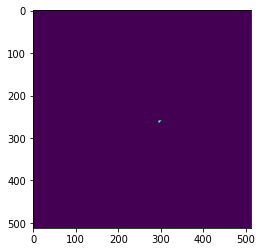

In [150]:
CT_mask[:,:,120]
print(np.unique(CT_mask[:,:,120]))
plt.imshow(CT_mask[:,:,120])

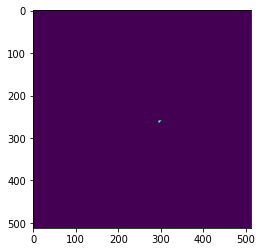

In [154]:
plt.imshow(CT_mask[:,:,120].astype(np.uint8))

In [159]:
imageio.imwrite(yolo_data_dir + '/sample.jpg', CT_mask[:,:,120])

Lossy conversion from int16 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


[0 1]


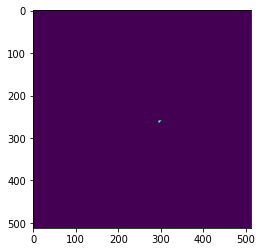

In [160]:
image = Image.open(yolo_data_dir + '/sample.jpg')
image = image.convert('1')
image = np.array(image)
image = image.astype(np.uint8)
plt.imshow(image)
print(np.unique(image))

In [86]:
import matplotlib.patches as patches
def plot_and_segment(predicted_paths, patient_id, nodule_num, test_root_dir=testdir):
    
    #get the directories
    imagedirname = None
    labeldirname = None
    dirname = patient_id#.replace('-','_')
    patientdir = test_root_dir + "/" + dirname
    imagedirname = patientdir + "/" + 'images'
    labeldirname = patientdir + "/" + 'labels'
    
    
    images = os.listdir(predicted_paths[nodule_num])
    labeldir = labeldirname + "/" + str(nodule_num)
    print("Loading labels from {}".format(labeldir))
    labels = os.listdir(labeldir)
    
    imagedir = imagedirname + "/" + str(nodule_num)
    source_images = os.listdir(imagedir)
    
    num_images_row = 1
    print("Number of images {}".format(len(images)))
    if len(images) > num_images_row: # need rows more than one
        num_rows = math.ceil(len(images)/num_images_row)
        f, a = plt.subplots(num_rows, num_images_row*3, figsize=(14, 35))
    c = 0
    for idx, (imgstr, src_imgstr) in enumerate(zip(images, source_images)):
        img = Image.open(predicted_paths[nodule_num] + "/" + imgstr)
        src_img = Image.open(imagedir + "/" + src_imgstr)
        if c > num_images_row-1:
            c = 0
        a[int(idx/num_images_row)][c].imshow(np.array(img))
        a[int(idx/num_images_row)][c+1].imshow(np.array(src_img))
        src_labelstr = src_imgstr.replace('.jpg','.txt')
        
        # predict the mask
        
        image = Image.open(imagedir + "/" + src_imgstr)
        image = np.array(image).astype('float32')
        image -= np.mean(image)
        image /= np.std(image)
        image = torch.from_numpy(image[np.newaxis,np.newaxis,:]).to(device)
        mask_pre = torch.sigmoid(seg_model(image)).detach().cpu().numpy()
        mask_pre = np.squeeze(mask_pre)
        mask_pre = np.where(mask_pre>0.5, 1,0)
        
        a[int(idx/num_images_row)][c+2].imshow(np.array(mask_pre))

        with open(labeldir + "/" + src_labelstr) as f:
            line = f.read()
            cls, x, y, w, h = line.split(' ')
            x, y, w, h = float(x), float(y), float(w), float(h)
            rect = patches.Rectangle((x, y), (w), (h), linewidth=1, edgecolor='r', facecolor='none')
            a[int(idx/num_images_row)][c+1].add_patch(rect)
            
        c += 1
    if c < num_images_row:
        for j in list(range(num_images_row,c,-1)):
            a.flat[-(num_images_row-j+1)].set_visible(False)
    plt.show()

Loading labels from /app/yolov5/test/LIDC-IDRI-0001/labels/0
Number of images 8


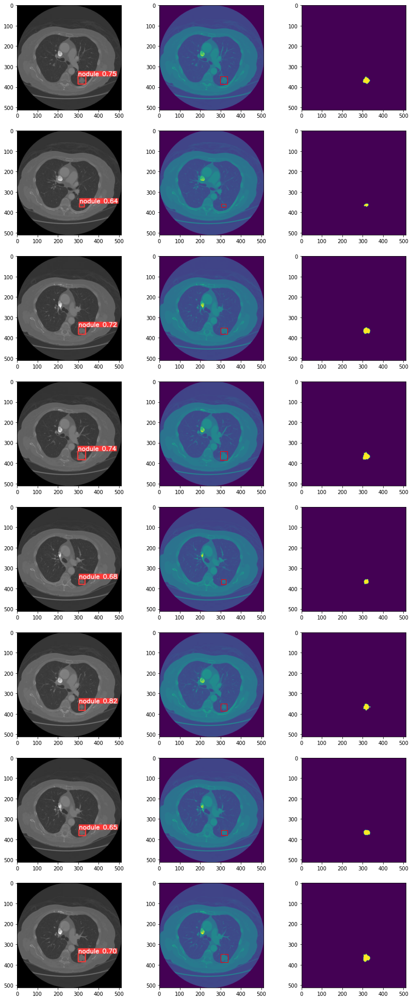

In [87]:
plot_and_segment(predicted_paths, 'LIDC-IDRI-0001', 0, '/app/yolov5/test')

### Inference pipeline

- Given a patient, extract all images from the CT and run Yolov5 to predict bounding boxes
- For images which have bounding boxes, run them through the segmentation model (unet)
- Compute the DICE score for each image and find the avgerage DICE score over all images based on ground truth mask

In [88]:
import os, shutil
import glob
from tqdm import tqdm

def removedir(dirname):
    print("Directory {} exists, removing!".format(dirname))
    files = glob.glob(dirname + "/*")
    for i in tqdm(range(len(files))):
        if os.path.isdir(files[i]):
            shutil.rmtree(files[i])
            

def save_patient_image_and_mask(patient_id, root_dir='/app/yolov5/test'):
    
    # create the directories
    imagedirname = None
    labeldirname = None
    dirname = patient_id#.replace('-','_')
    patientdir = root_dir + "/" + dirname
    imagedirname = patientdir + "/" + 'images'
    maskdirname = patientdir + "/" + 'masks'
     
    #clean up any previous data for this patient
    if os.path.exists(patientdir):
        removedir(patientdir)

    print("Creating directory {}".format(imagedirname))
    os.makedirs(imagedirname)

    print("Creating directory {}".format(maskdirname))
    os.makedirs(maskdirname)
            
    # query the image data from the CT volume
    print("Reading data for patient {}".format(patient_id))
    scan = pl.query(pl.Scan).filter(pl.Scan.patient_id.in_([patient_id]))[0]
    nodules_annotation = scan.cluster_annotations()
    with contextlib.redirect_stdout(None):
        vol = scan.to_volume()
    
    
    # iterate through all slices and save the images
    z_slice_cnt = 0
    for z_slice in range(vol.shape[2]):
        im = vol[:,:,z_slice]
        image_filename = "{}_{}.jpg".format(patient_id, z_slice)
        imageio.imwrite(imagedirname + "/" + image_filename, im)
        z_slice_cnt += 1
    print("Saved {} images for patient {}".format(z_slice_cnt, patient_id))
    
    
    # save all the masks
    cmask_CT = []
    cbbox_CT = []
    masks_CT = []
    for nodule_idx, nodule in enumerate(nodules_annotation):
        cmask, cbbox, masks = consensus(nodule)
        cmask_CT.append(cmask)
        cbbox_CT.append(cbbox)
        masks_CT.append(masks)
    CT_mask = np.zeros_like(vol)    
    nodule_num = len(cmask_CT)
    print("Number of nodules for patient {} is {}".format(patient_id, nodule_num))
    
    for i in range(nodule_num):
        cmask = cmask_CT[i]
        cbbox = cbbox_CT[i]
        masks = masks_CT[i]
        CT_mask[cbbox] += cmask
        img_count = 0
        for k_slice in np.arange(cbbox[2].start, cbbox[2].stop):
            msk = CT_mask[:,:,k_slice]
            mask_filename = "{}_{}_{}.txt".format(patient_id, i, k_slice)
            maskdir = maskdirname + "/" + str(i)
            if not os.path.exists(maskdir):
                os.makedirs(maskdir)
            imageio.imwrite(maskdir + "/" + mask_filename, msk)
            img_count += 1
        print("Saved {} masks for nodule {} of patient {}".format(img_count, i, patient_id))
    return nodule_num

## Backup

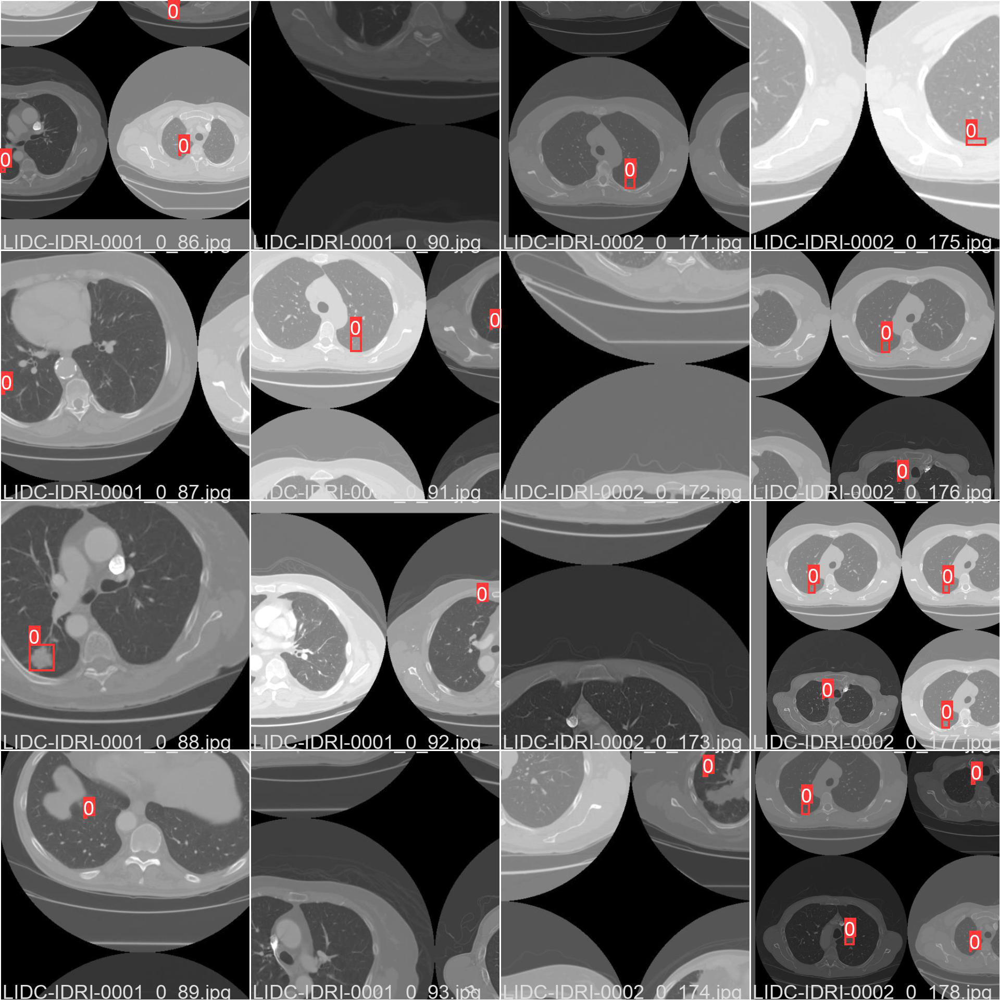

In [165]:
Image.open('runs/train/yolov5s_results2/train_batch0.jpg')

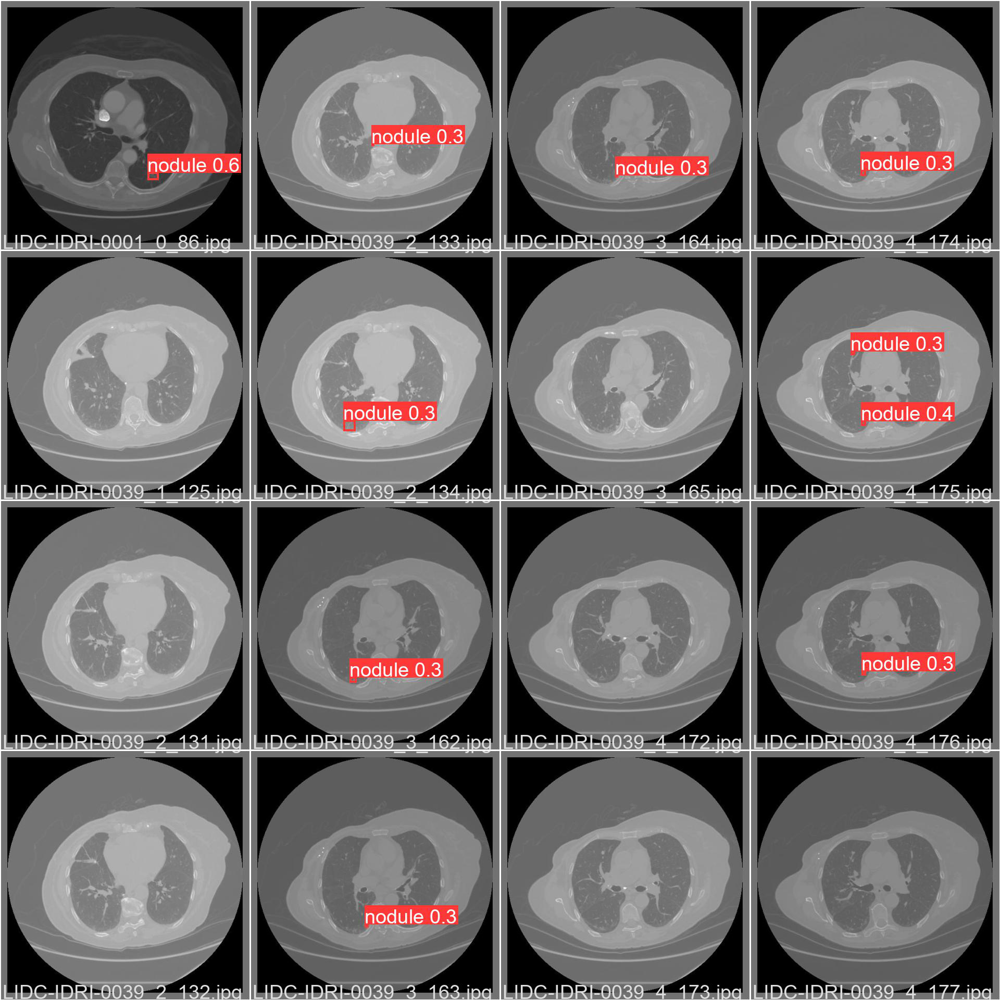

In [342]:
Image.open('runs/train/yolov5s_results3/val_batch0_pred.jpg')

In [212]:
!cat /app/data/yolov5/train/labels/LIDC-IDRI-0008_0_70.txt

0 0.228515625 0.5732421875 0.033203125 0.01953125

In [12]:
!cat /app/data/yolov5/train/labels/LIDC-IDRI-0001_0_90.txt

0 0.630859375 0.70703125 0.0859375 0.1015625

In [16]:
!cat /app/data/yolov5/train/labels/LIDC-IDRI-0001_0_86.txt

0 0.630859375 0.70703125 0.0859375 0.1015625

In [199]:
#!apt-get update

Get:1 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal InRelease [265 kB]                
Get:3 http://security.ubuntu.com/ubuntu focal-security/universe amd64 Packages [801 kB]
Get:4 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Get:5 http://archive.ubuntu.com/ubuntu focal-backports InRelease [101 kB]
Get:6 http://security.ubuntu.com/ubuntu focal-security/main amd64 Packages [1183 kB]
Get:7 http://security.ubuntu.com/ubuntu focal-security/multiverse amd64 Packages [30.1 kB]
Get:8 http://security.ubuntu.com/ubuntu focal-security/restricted amd64 Packages [628 kB]
Get:9 http://archive.ubuntu.com/ubuntu focal/multiverse amd64 Packages [177 kB]
Get:10 http://archive.ubuntu.com/ubuntu focal/main amd64 Packages [1275 kB]
Get:11 http://archive.ubuntu.com/ubuntu focal/universe amd64 Packages [11.3 MB]
Get:12 http://archive.ubuntu.com/ubuntu focal/restricted amd64 Packages [33.4 kB]
Get:13 http://archive.ubuntu

In [201]:
#!apt-get install ffmpeg libsm6 libxext6  -y

In [25]:
!cat /app/roboflow/train/labels/LIDC-IDRI-0001_0_90_jpg.rf.170ce2dfe4b92cc2dde7134fd4fd7071.txt

0 0.6274038461538461 0.7175480769230769 0.09615384615384616 0.09134615384615384

In [21]:
ls /app/roboflow/train/images/

LIDC-IDRI-0001_0_90_jpg.rf.170ce2dfe4b92cc2dde7134fd4fd7071.jpg


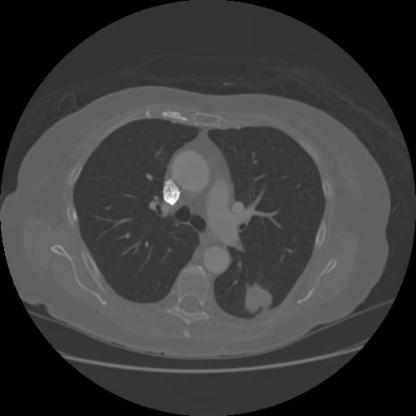

In [22]:
Image.open('/app/roboflow/train/images/LIDC-IDRI-0001_0_90_jpg.rf.170ce2dfe4b92cc2dde7134fd4fd7071.jpg')

In [53]:
ls /app/yolov5/runs/train/yolov5s_results23

confusion_matrix.png                                test_batch0_pred.jpg
events.out.tfevents.1635700289.e9ea4f0c832f.3518.0  test_batch1_labels.jpg
hyp.yaml                                            test_batch1_pred.jpg
labels.jpg                                          test_batch2_labels.jpg
labels_correlogram.jpg                              test_batch2_pred.jpg
opt.yaml                                            train_batch0.jpg
results.png                                         train_batch1.jpg
results.txt                                         train_batch2.jpg
test_batch0_labels.jpg                              weights/


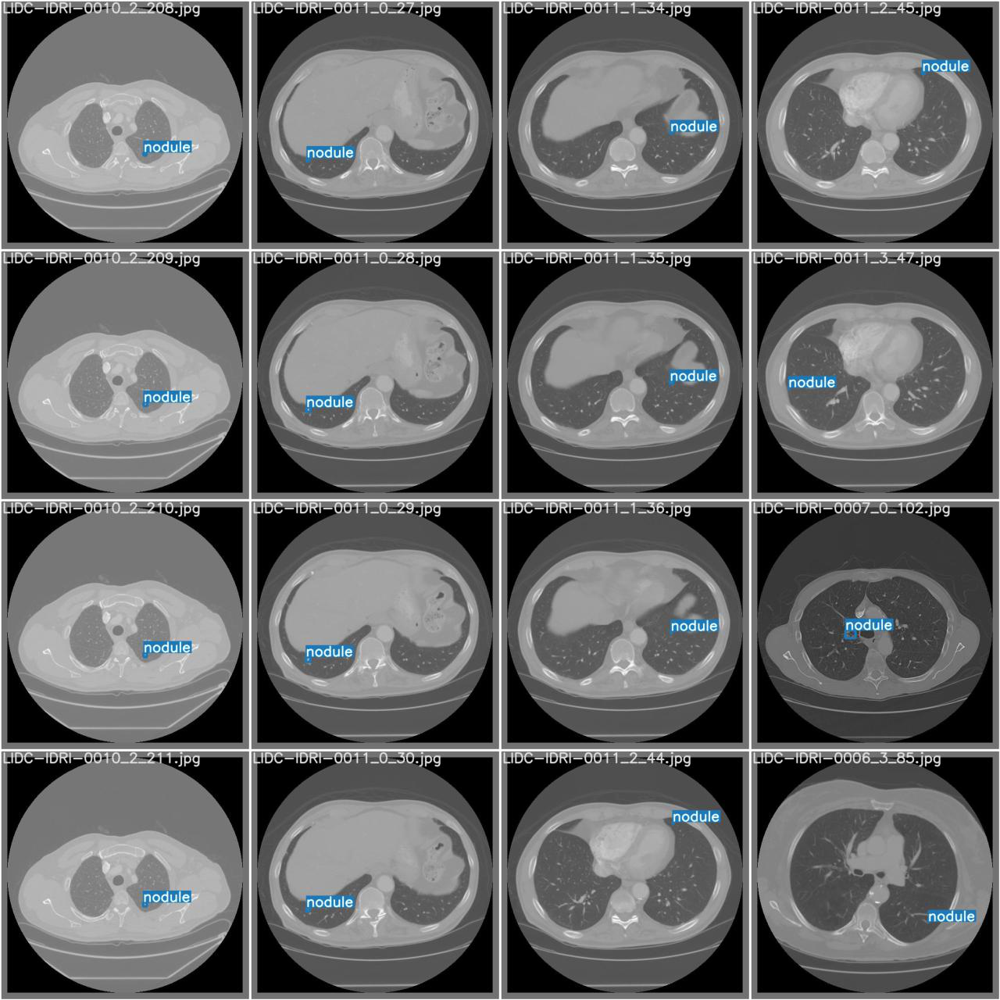

In [54]:
Image.open('/app/yolov5/runs/train/yolov5s_results23/test_batch2_labels.jpg')

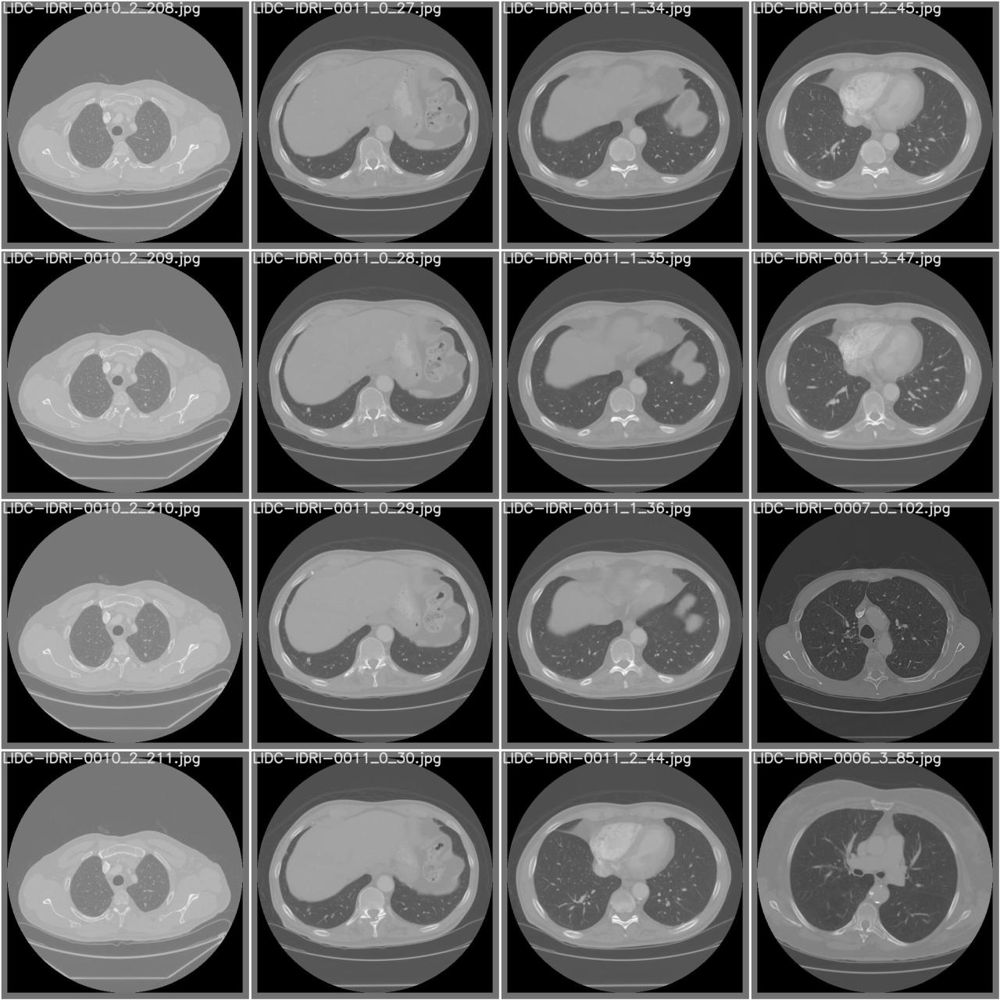

In [55]:
Image.open('/app/yolov5/runs/train/yolov5s_results23/test_batch2_pred.jpg')

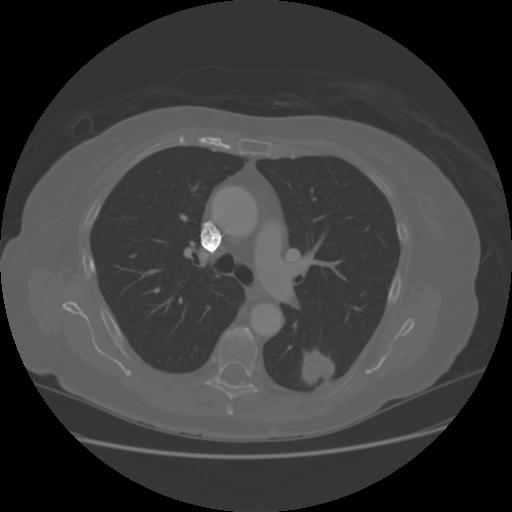

In [11]:
Image.open('/app/data/yolov5/train/images/LIDC-IDRI-0001_0_90.jpg')

In [143]:
ls /app/data/yolov5/train/images

LIDC-IDRI-0001_0_86.jpg   LIDC-IDRI-0003_2_84.jpg   LIDC-IDRI-0008_1_87.jpg
LIDC-IDRI-0001_0_87.jpg   LIDC-IDRI-0003_3_81.jpg   LIDC-IDRI-0008_1_88.jpg
LIDC-IDRI-0001_0_88.jpg   LIDC-IDRI-0003_3_82.jpg   LIDC-IDRI-0008_1_89.jpg
LIDC-IDRI-0001_0_89.jpg   LIDC-IDRI-0003_3_83.jpg   LIDC-IDRI-0009_0_102.jpg
LIDC-IDRI-0001_0_90.jpg   LIDC-IDRI-0003_3_84.jpg   LIDC-IDRI-0009_0_103.jpg
LIDC-IDRI-0001_0_91.jpg   LIDC-IDRI-0003_3_85.jpg   LIDC-IDRI-0009_0_104.jpg
LIDC-IDRI-0001_0_92.jpg   LIDC-IDRI-0003_3_86.jpg   LIDC-IDRI-0009_1_165.jpg
LIDC-IDRI-0001_0_93.jpg   LIDC-IDRI-0003_3_87.jpg   LIDC-IDRI-0009_1_166.jpg
LIDC-IDRI-0001_0_94.jpg   LIDC-IDRI-0003_3_88.jpg   LIDC-IDRI-0009_1_167.jpg
LIDC-IDRI-0002_0_171.jpg  LIDC-IDRI-0004_0_74.jpg   LIDC-IDRI-0009_1_168.jpg
LIDC-IDRI-0002_0_172.jpg  LIDC-IDRI-0004_0_75.jpg   LIDC-IDRI-0010_0_67.jpg
LIDC-IDRI-0002_0_173.jpg  LIDC-IDRI-0004_0_76.jpg   LIDC-IDRI-0010_0_68.jpg
LIDC-IDRI-0002_0_174.jpg  LIDC-IDRI-0004_0_77.jpg   LIDC-IDRI-0010_0_69.jpg
LIDC-

Loading dicom files ... This may take a moment.


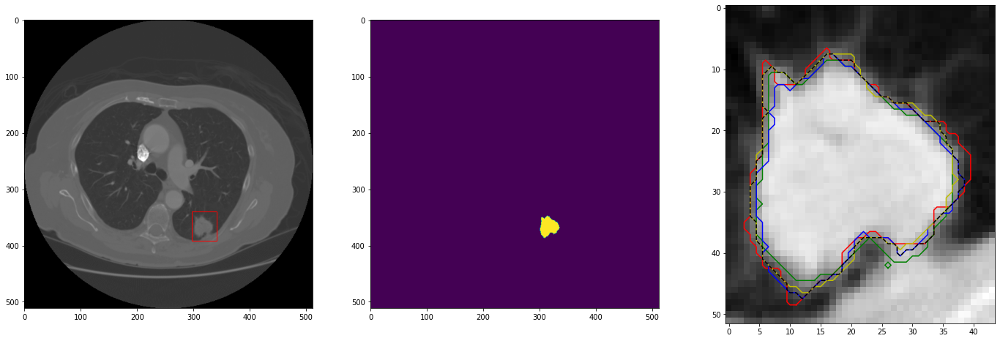

In [227]:
%matplotlib inline
import matplotlib.patches as patches
patient_select = 0
cohort = data_folder
patient_list = os.listdir(cohort)
patient_select = 0

#print ("Current patient ID =", patient_list[patient_select])
patient_list = ['LIDC-IDRI-0001']
scan = pl.query(pl.Scan).filter(pl.Scan.patient_id.in_(patient_list))
nodules_annotation = scan[patient_select].cluster_annotations()
vol = scan[patient_select].to_volume()

cmask_CT = []
cbbox_CT = []
masks_CT = []
for nodule_idx, nodule in enumerate(nodules_annotation):
    cmask, cbbox, masks = consensus(nodule)
    cmask_CT.append(cmask)
    cbbox_CT.append(cbbox)
    masks_CT.append(masks)   

nodule_num = len(cmask_CT)
plt.figure(figsize=(8*3,8*nodule_num))
for i in range(nodule_num):
    cmask = cmask_CT[i]
    cbbox = cbbox_CT[i]
    masks = masks_CT[i]
    k = int(0.5*(cbbox[2].stop - cbbox[2].start))
    k_slice = k + cbbox[2].start
    ax = plt.subplot(nodule_num,3,1+i*3)
    im1 = vol[:,:,k_slice]
    #im1 = Image.fromarray(im1)
    #im1 = im1.transpose(Image.FLIP_TOP_BOTTOM)
    #im1 = np.flip(im1, 0)
    #PIL.Image.FLIP_TOP_BOTTOM
    plt.imshow(im1,cmap='gray')
    #plt.clim(vmin=-1350,vmax=-150)
    
    x,y,z = cbbox
    rect = patches.Rectangle((y.start, x.start), (y.stop-y.start), (x.stop-x.start), linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect)
    
    plt.subplot(nodule_num,3,2+i*3)
    CT_mask = np.zeros_like(vol)
    CT_mask[cbbox] = cmask
    plt.imshow(CT_mask[:,:,k_slice])

    plt.subplot(nodule_num,3,3+i*3)
    plt.imshow(vol[cbbox][:,:,k],cmap='gray')
    # Plot the annotation contours for the kth slice.
    colors = ['r', 'g', 'b', 'y']
    for j in range(len(masks)):
        for c in find_contours(masks[j][:,:,k].astype(float), 0.5):
            label = "Annotation %d" % (j+1)
            plt.plot(c[:,1], c[:,0], colors[j], label=label)

    # Plot the 50% consensus contour for the kth slice.
    for c in find_contours(cmask[:,:,k].astype(float), 0.5):
        plt.plot(c[:,1], c[:,0], '--k', label='50% Consensus')